## Preparing the Metadata
The metadata extracted from the dicom images are extracted and then submited to the model to improve the results.

In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import pydicom

import gc
import warnings

warnings.simplefilter(action = 'ignore')
file_path = "patients_meta.csv"

In [2]:
df_meta = pd.read_csv(file_path)


In [3]:
to_drop = df_meta.nunique()
to_drop = to_drop[(to_drop <= 1) | (to_drop == to_drop['patientId']) | 
                  (to_drop == to_drop['Unnamed: 0']
                  )].index
to_drop = to_drop.drop('patientId')
to_drop

Index(['Unnamed: 0', 'AccessionNumber', 'BitsAllocated', 'BitsStored',
       'BodyPartExamined', 'Columns', 'ConversionType', 'HighBit',
       'InstanceNumber', 'LossyImageCompression',
       'LossyImageCompressionMethod', 'Modality', 'PatientBirthDate',
       'PatientID', 'PatientName', 'PatientOrientation',
       'PhotometricInterpretation', 'PixelRepresentation',
       'ReferringPhysicianName', 'Rows', 'SOPClassUID', 'SOPInstanceUID',
       'SamplesPerPixel', 'SeriesInstanceUID', 'SeriesNumber',
       'SpecificCharacterSet', 'StudyDate', 'StudyID', 'StudyInstanceUID',
       'StudyTime'],
      dtype='object')

In [4]:
df_meta.drop(to_drop, axis = 1, inplace = True)
df_meta.head()

,patientId,x,y,width,height,Target,PatientAge,PatientSex,SeriesDescription,ViewPosition
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,51,F,view: PA,PA
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,48,F,view: PA,PA
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,19,M,view: AP,AP
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,28,M,view: PA,PA
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,32,F,view: AP,AP


In [5]:
df_meta.drop(df_meta[['x', 'y','height', 'width', 'SeriesDescription']], axis = 1, inplace = True)
df_meta.head()

,patientId,Target,PatientAge,PatientSex,ViewPosition
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,0,51,F,PA
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,0,48,F,PA
2,00322d4d-1c29-4943-afc9-b6754be640eb,0,19,M,AP
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,0,28,M,PA
4,00436515-870c-4b36-a041-de91049b9ab4,1,32,F,AP


### Quantizing the numeric data

In [6]:
def quantize_age(value, year_interval=5):
    return ((value // year_interval) * year_interval) + 1

def quantize_age_10(value):
    return quantize_age(value, 10)

quantize_age(4), quantize_age(5), quantize_age(32), quantize_age(84), quantize_age(86), quantize_age(89)

(1, 6, 31, 81, 86, 86)

In [7]:
df_meta['PatientSex'] = df_meta['PatientSex'].map({'F': 0, 'M': 1})
df_meta['ViewPosition'] = df_meta['ViewPosition'].map({'PA': 0, 'AP': 1})
df_meta['age_5'] = df_meta['PatientAge'].map(quantize_age)
df_meta['age_10'] = df_meta['PatientAge'].map(quantize_age_10)
df_meta.head()

,patientId,Target,PatientAge,PatientSex,ViewPosition,age_5,age_10
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,0,51,0,0,51,51
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,0,48,0,0,46,41
2,00322d4d-1c29-4943-afc9-b6754be640eb,0,19,1,1,16,11
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,0,28,1,0,26,21
4,00436515-870c-4b36-a041-de91049b9ab4,1,32,0,1,31,31


In [8]:
df_meta['age_5'] /= 120 
df_meta['age_10'] /= 120

In [9]:
df_meta.drop('PatientAge', axis = 1, inplace = True)
df_meta.head()

,patientId,Target,PatientSex,ViewPosition,age_5,age_10
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,0,0,0,0.425000,0.425000
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,0,0,0,0.383333,0.341667
2,00322d4d-1c29-4943-afc9-b6754be640eb,0,1,1,0.133333,0.091667
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,0,1,0,0.216667,0.175000
4,00436515-870c-4b36-a041-de91049b9ab4,1,0,1,0.258333,0.258333


In [10]:
df_meta.to_csv('extractfied_meta.csv')

In [11]:
df_meta.from_csv('extractfied_meta.csv')
df_meta.head()

,patientId,Target,PatientSex,ViewPosition,age_5,age_10
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,0,0,0,0.425000,0.425000
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,0,0,0,0.383333,0.341667
2,00322d4d-1c29-4943-afc9-b6754be640eb,0,1,1,0.133333,0.091667
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,0,1,0,0.216667,0.175000
4,00436515-870c-4b36-a041-de91049b9ab4,1,0,1,0.258333,0.258333


In [12]:
from PIL import Image
target_img  = '03e9a70f-3de8-4e13-b3f2-9dd6d75f496d'
output_dir='../rsna-pneumonia-retina/data/with_meta/'
image = Image.open(f'../rsna-pneumonia-retina/data/processed/train_png/{target_img}.png')

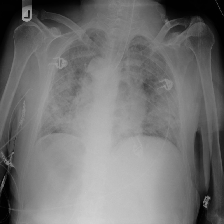

In [13]:
image.resize((224,224))

In [14]:
def get_img_meta(patient_id, img, df_meta):
    base_meta = df_meta[df_meta.patientId == patient_id].values[0][2:]
    meta_block = np.vstack([base_meta,base_meta,base_meta,base_meta])
    meta_channel = np.tile(meta_block, (56, 56))
    small_image = np.asarray(img.resize((224, 224)))
    fake_img=np.zeros((224, 224, 3), dtype=np.uint8)
    fake_img[:, :, 0] = np.asarray(small_image)
    fake_img[:, :, 1] = np.asarray(small_image)
    fake_img[:, :, 2] = meta_channel * 255
    
    return fake_img

In [15]:
fake_img = get_img_meta(target_img, image, df_meta)


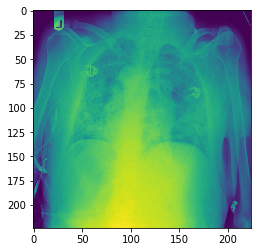

In [16]:
plt.imshow(fake_img[:,:,0])

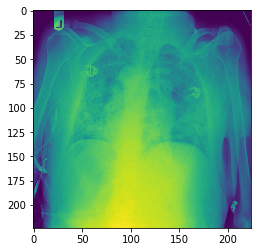

In [17]:
plt.imshow(fake_img[:,:,1])

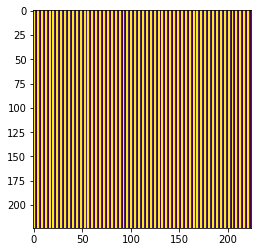

In [18]:
plt.imshow(fake_img[:,:,2])

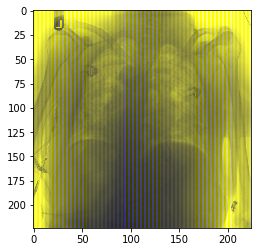

In [19]:
plt.imshow(255-fake_img )

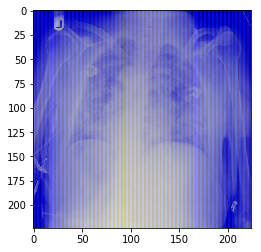

In [20]:
plt.imshow(fake_img )

Progress 100/26681
Saving 03c149d1-e420-40bf-8d60-f98d0fff1d48 as ../rsna-pneumonia-retina/data/with_meta//03c149d1-e420-40bf-8d60-f98d0fff1d48.png


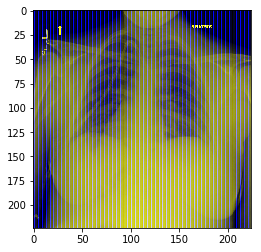

Progress 200/26681
Saving 06415658-2590-4c38-a682-81acf9ef9a14 as ../rsna-pneumonia-retina/data/with_meta//06415658-2590-4c38-a682-81acf9ef9a14.png


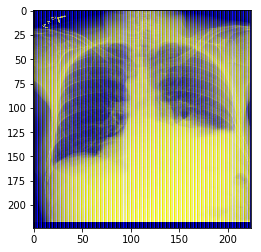

Progress 300/26681
Saving 0727efd2-c063-4409-b326-9532f6531a97 as ../rsna-pneumonia-retina/data/with_meta//0727efd2-c063-4409-b326-9532f6531a97.png


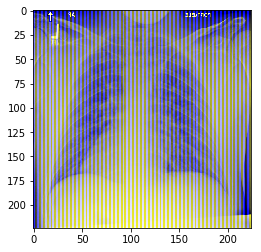

Progress 400/26681
Saving 0803b0fa-c026-40d3-b9b6-43b843d17632 as ../rsna-pneumonia-retina/data/with_meta//0803b0fa-c026-40d3-b9b6-43b843d17632.png


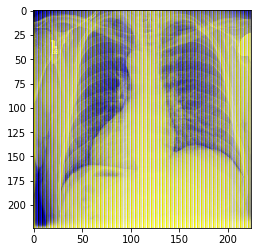

Progress 500/26681
Saving 08fda39f-ba68-45cc-9bbb-d416b19c6dc2 as ../rsna-pneumonia-retina/data/with_meta//08fda39f-ba68-45cc-9bbb-d416b19c6dc2.png


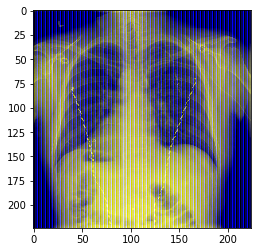

Progress 600/26681
Saving 09d79f22-df14-4e5a-bc98-7a1d6bcd6965 as ../rsna-pneumonia-retina/data/with_meta//09d79f22-df14-4e5a-bc98-7a1d6bcd6965.png


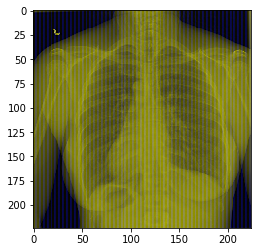

Progress 700/26681
Saving 0ae93f35-2954-41a2-a33b-6614f36dd1c3 as ../rsna-pneumonia-retina/data/with_meta//0ae93f35-2954-41a2-a33b-6614f36dd1c3.png


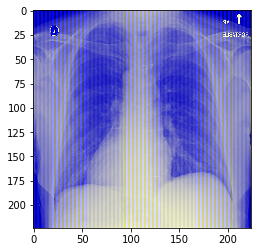

Progress 800/26681
Saving 0bbb1ff7-dba6-4d5b-affe-b3ca0050d965 as ../rsna-pneumonia-retina/data/with_meta//0bbb1ff7-dba6-4d5b-affe-b3ca0050d965.png


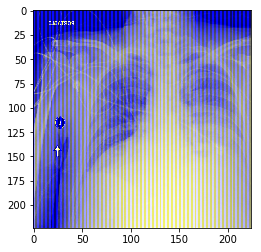

Progress 900/26681
Saving 0c89ca38-27ca-4cd0-88cb-18093fdcb04b as ../rsna-pneumonia-retina/data/with_meta//0c89ca38-27ca-4cd0-88cb-18093fdcb04b.png


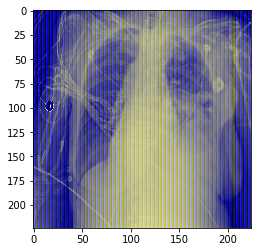

Progress 1000/26681
Saving 0fad7782-a936-4a72-8918-e3bc97cf690e as ../rsna-pneumonia-retina/data/with_meta//0fad7782-a936-4a72-8918-e3bc97cf690e.png


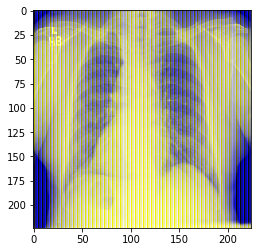

Progress 1100/26681
Saving 1562c5c8-39cf-4fb2-8592-eafdeeeb5dd2 as ../rsna-pneumonia-retina/data/with_meta//1562c5c8-39cf-4fb2-8592-eafdeeeb5dd2.png


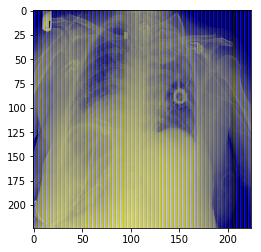

Progress 1200/26681
Saving 1617a0bd-1dcf-45a5-8f0c-e0fcbadd48ce as ../rsna-pneumonia-retina/data/with_meta//1617a0bd-1dcf-45a5-8f0c-e0fcbadd48ce.png


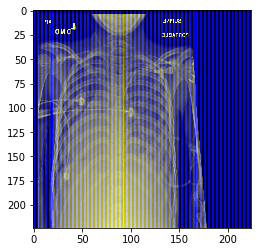

Progress 1300/26681
Saving 170632ff-5466-42a1-95f3-30ea4ef63e3b as ../rsna-pneumonia-retina/data/with_meta//170632ff-5466-42a1-95f3-30ea4ef63e3b.png


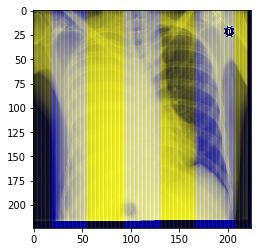

Progress 1400/26681
Saving 17e5fca2-a7f4-44eb-9ecf-2fbfd4debf73 as ../rsna-pneumonia-retina/data/with_meta//17e5fca2-a7f4-44eb-9ecf-2fbfd4debf73.png


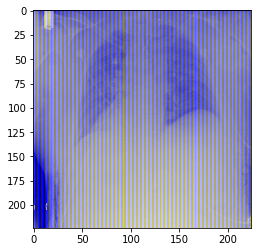

Progress 1500/26681
Saving 18be2116-e8dd-4c42-8c56-8f2672e35bb7 as ../rsna-pneumonia-retina/data/with_meta//18be2116-e8dd-4c42-8c56-8f2672e35bb7.png


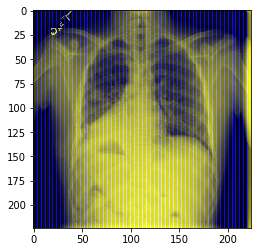

Progress 1600/26681
Saving 1b3bc37d-dfa7-4dee-a7dc-18008b346586 as ../rsna-pneumonia-retina/data/with_meta//1b3bc37d-dfa7-4dee-a7dc-18008b346586.png


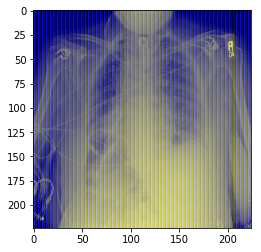

Progress 1700/26681
Saving 2278d9f3-e7bf-4e36-a194-aaf5bdb20762 as ../rsna-pneumonia-retina/data/with_meta//2278d9f3-e7bf-4e36-a194-aaf5bdb20762.png


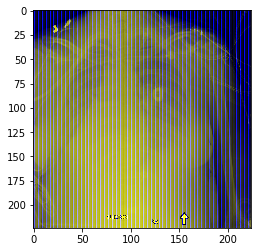

Progress 1800/26681
Saving 281d879b-1f4a-4ef9-a88a-c311d31415ab as ../rsna-pneumonia-retina/data/with_meta//281d879b-1f4a-4ef9-a88a-c311d31415ab.png


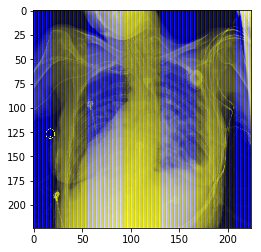

Progress 1900/26681
Saving 2e8d7684-3d6d-4516-b849-3666030db7b7 as ../rsna-pneumonia-retina/data/with_meta//2e8d7684-3d6d-4516-b849-3666030db7b7.png


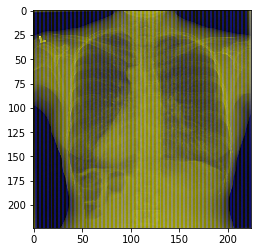

Progress 2000/26681
Saving 31a7fd05-b49d-4220-9268-33a61f4663a3 as ../rsna-pneumonia-retina/data/with_meta//31a7fd05-b49d-4220-9268-33a61f4663a3.png


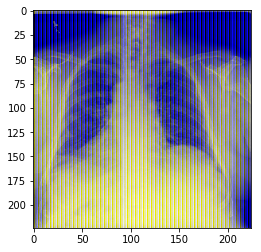

Progress 2100/26681
Saving 32827da4-939c-46de-85db-a2d75cb0dfad as ../rsna-pneumonia-retina/data/with_meta//32827da4-939c-46de-85db-a2d75cb0dfad.png


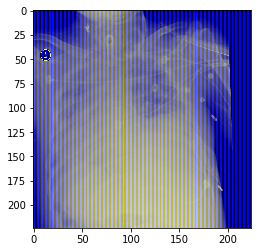

Progress 2200/26681
Saving 336622cd-55bc-4404-beb1-8c75de224d0a as ../rsna-pneumonia-retina/data/with_meta//336622cd-55bc-4404-beb1-8c75de224d0a.png


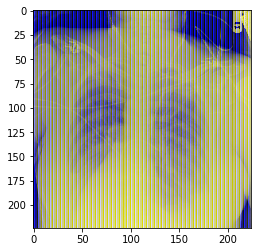

Progress 2300/26681
Saving 3454a6ae-2660-44c8-b15a-0f8a65ba0c6e as ../rsna-pneumonia-retina/data/with_meta//3454a6ae-2660-44c8-b15a-0f8a65ba0c6e.png


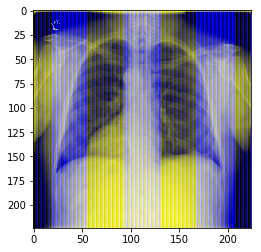

Progress 2400/26681
Saving 3514e23d-3fbf-4695-9e81-ce5a83212984 as ../rsna-pneumonia-retina/data/with_meta//3514e23d-3fbf-4695-9e81-ce5a83212984.png


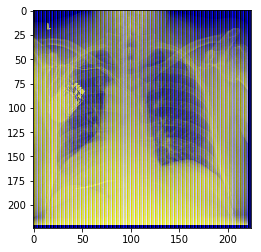

Progress 2500/26681
Saving 35ef8c74-74d5-49ae-8b45-98d349344628 as ../rsna-pneumonia-retina/data/with_meta//35ef8c74-74d5-49ae-8b45-98d349344628.png


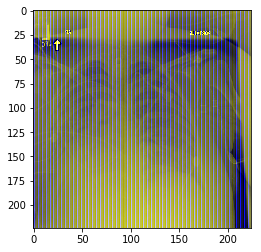

Progress 2600/26681
Saving 36ef9113-5ea4-4812-a5ea-fdb0e3e028ba as ../rsna-pneumonia-retina/data/with_meta//36ef9113-5ea4-4812-a5ea-fdb0e3e028ba.png


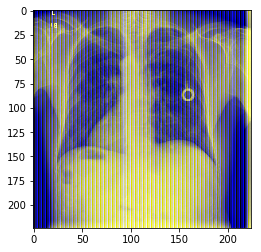

Progress 2700/26681
Saving 37b37037-486d-494d-948a-5d66d308dd45 as ../rsna-pneumonia-retina/data/with_meta//37b37037-486d-494d-948a-5d66d308dd45.png


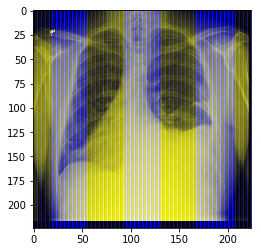

Progress 2800/26681
Saving 388c90bd-a30c-4ded-a5e9-50ef0a903467 as ../rsna-pneumonia-retina/data/with_meta//388c90bd-a30c-4ded-a5e9-50ef0a903467.png


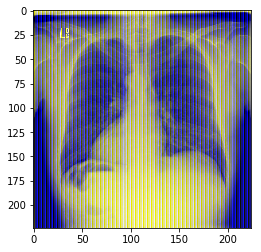

Progress 2900/26681
Saving 3934d9db-dc88-4a5f-8310-129c505d86c3 as ../rsna-pneumonia-retina/data/with_meta//3934d9db-dc88-4a5f-8310-129c505d86c3.png


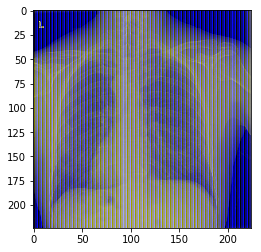

Progress 3000/26681
Saving 3a19bdf2-b88b-4414-97bd-b24d79cdd53d as ../rsna-pneumonia-retina/data/with_meta//3a19bdf2-b88b-4414-97bd-b24d79cdd53d.png


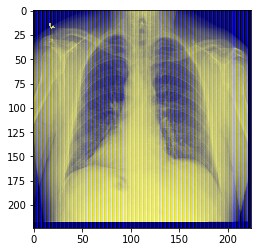

Progress 3100/26681
Saving 3aebc0d6-6625-4e62-a895-53136bb34078 as ../rsna-pneumonia-retina/data/with_meta//3aebc0d6-6625-4e62-a895-53136bb34078.png


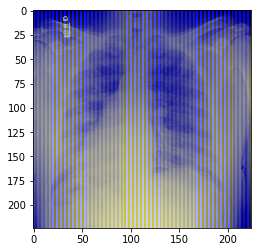

Progress 3200/26681
Saving 3bc56686-1c63-4d08-b2ec-8e112db205a2 as ../rsna-pneumonia-retina/data/with_meta//3bc56686-1c63-4d08-b2ec-8e112db205a2.png


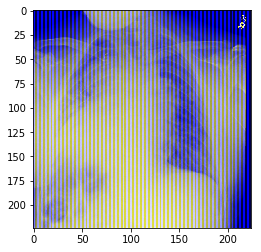

Progress 3300/26681
Saving 3c92c85a-acb7-49dc-b732-1b6e203e6d7b as ../rsna-pneumonia-retina/data/with_meta//3c92c85a-acb7-49dc-b732-1b6e203e6d7b.png


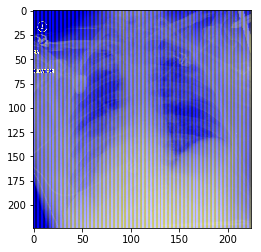

Progress 3400/26681
Saving 3d6c05e8-8db1-4d72-8cb5-8068b649161b as ../rsna-pneumonia-retina/data/with_meta//3d6c05e8-8db1-4d72-8cb5-8068b649161b.png


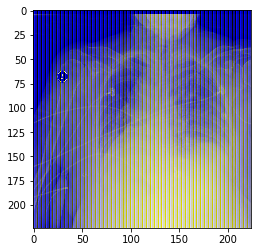

Progress 3500/26681
Saving 3e5e1e9c-4b31-416a-a068-a4e2fc100f10 as ../rsna-pneumonia-retina/data/with_meta//3e5e1e9c-4b31-416a-a068-a4e2fc100f10.png


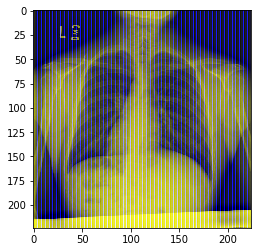

Progress 3600/26681
Saving 3f382606-c1bd-4742-82f8-36feafa7e643 as ../rsna-pneumonia-retina/data/with_meta//3f382606-c1bd-4742-82f8-36feafa7e643.png


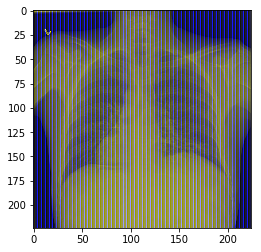

Progress 3700/26681
Saving 402cf979-6bd9-48c2-9b9d-2f060881f55c as ../rsna-pneumonia-retina/data/with_meta//402cf979-6bd9-48c2-9b9d-2f060881f55c.png


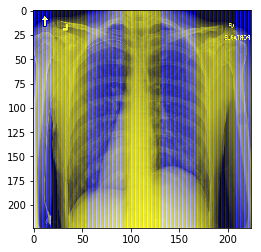

Progress 3800/26681
Saving 40f55d75-0e89-4392-a32c-84ff66530a4a as ../rsna-pneumonia-retina/data/with_meta//40f55d75-0e89-4392-a32c-84ff66530a4a.png


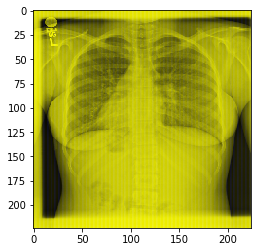

Progress 3900/26681
Saving 41bd3bce-27fe-4ac5-b972-058614eab7ac as ../rsna-pneumonia-retina/data/with_meta//41bd3bce-27fe-4ac5-b972-058614eab7ac.png


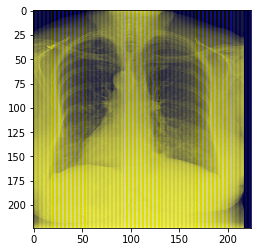

Progress 4000/26681
Saving 42ba9ff6-f422-444a-932b-b030624a9c2a as ../rsna-pneumonia-retina/data/with_meta//42ba9ff6-f422-444a-932b-b030624a9c2a.png


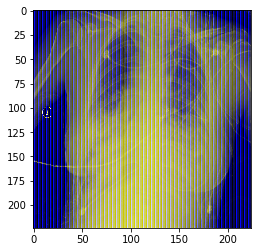

Progress 4100/26681
Saving 43c93bad-8332-4df5-ba24-97638e7b422e as ../rsna-pneumonia-retina/data/with_meta//43c93bad-8332-4df5-ba24-97638e7b422e.png


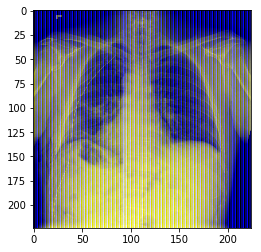

Progress 4200/26681
Saving 44a8fb24-5f75-4e9a-a187-70f3e608fd62 as ../rsna-pneumonia-retina/data/with_meta//44a8fb24-5f75-4e9a-a187-70f3e608fd62.png


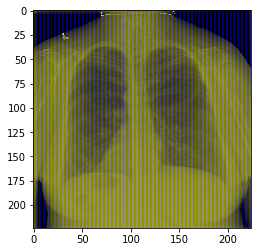

Progress 4300/26681
Saving 456df612-bc48-437d-a247-10a82d93e86e as ../rsna-pneumonia-retina/data/with_meta//456df612-bc48-437d-a247-10a82d93e86e.png


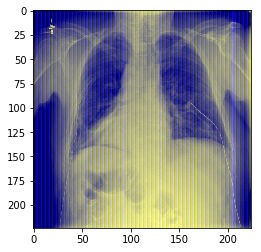

Progress 4400/26681
Saving 464d7389-cbe4-46df-a2fe-b5c9bfca664e as ../rsna-pneumonia-retina/data/with_meta//464d7389-cbe4-46df-a2fe-b5c9bfca664e.png


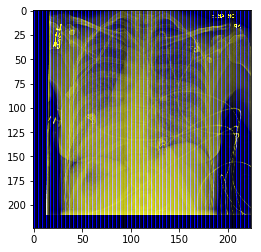

Progress 4500/26681
Saving 4717b1ad-61de-4dc6-a4cf-7a40951b59d3 as ../rsna-pneumonia-retina/data/with_meta//4717b1ad-61de-4dc6-a4cf-7a40951b59d3.png


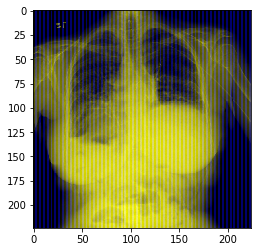

Progress 4600/26681
Saving 47f2c736-72d5-4897-b0c7-7119f0fd88c7 as ../rsna-pneumonia-retina/data/with_meta//47f2c736-72d5-4897-b0c7-7119f0fd88c7.png


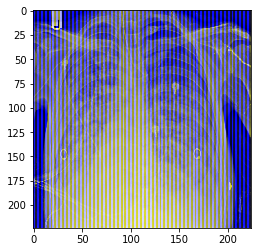

Progress 4700/26681
Saving 48e5400d-0821-4d48-b83e-92c3f24c6502 as ../rsna-pneumonia-retina/data/with_meta//48e5400d-0821-4d48-b83e-92c3f24c6502.png


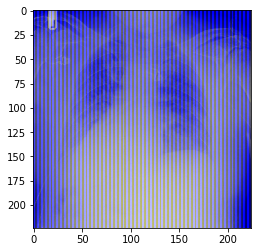

Progress 4800/26681
Saving 49c413cc-e806-4bc4-b744-1987261282c1 as ../rsna-pneumonia-retina/data/with_meta//49c413cc-e806-4bc4-b744-1987261282c1.png


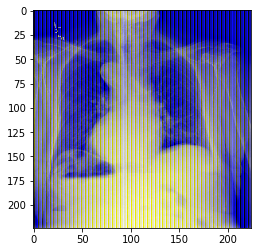

Progress 4900/26681
Saving 4aa7db1e-ea71-4b63-ae8a-877244ae1e06 as ../rsna-pneumonia-retina/data/with_meta//4aa7db1e-ea71-4b63-ae8a-877244ae1e06.png


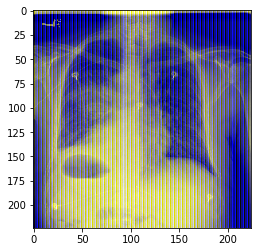

Progress 5000/26681
Saving 4b7d10d8-97b4-4d5b-9a74-01c7c8a13b10 as ../rsna-pneumonia-retina/data/with_meta//4b7d10d8-97b4-4d5b-9a74-01c7c8a13b10.png


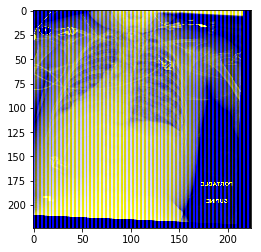

Progress 5100/26681
Saving 4c608577-dc40-44ab-9d91-c669c4c14bd0 as ../rsna-pneumonia-retina/data/with_meta//4c608577-dc40-44ab-9d91-c669c4c14bd0.png


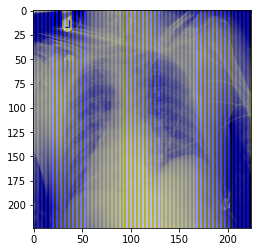

Progress 5200/26681
Saving 4d53c767-907b-4e70-870e-54cfd2aa86ec as ../rsna-pneumonia-retina/data/with_meta//4d53c767-907b-4e70-870e-54cfd2aa86ec.png


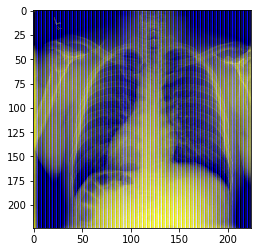

Progress 5300/26681
Saving 4e2468e2-a8f0-4243-831b-6b227c913e64 as ../rsna-pneumonia-retina/data/with_meta//4e2468e2-a8f0-4243-831b-6b227c913e64.png


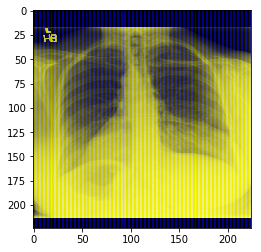

Progress 5400/26681
Saving 4eff8749-55c8-4129-b2d4-fe35963037f2 as ../rsna-pneumonia-retina/data/with_meta//4eff8749-55c8-4129-b2d4-fe35963037f2.png


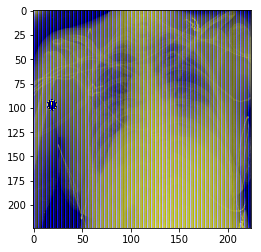

Progress 5500/26681
Saving 4fd33b9b-f9fb-4b52-9858-1979e8d43777 as ../rsna-pneumonia-retina/data/with_meta//4fd33b9b-f9fb-4b52-9858-1979e8d43777.png


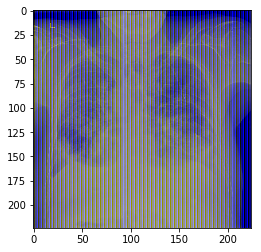

Progress 5600/26681
Saving 5093633b-af1a-40b0-ab97-6aa4c586661f as ../rsna-pneumonia-retina/data/with_meta//5093633b-af1a-40b0-ab97-6aa4c586661f.png


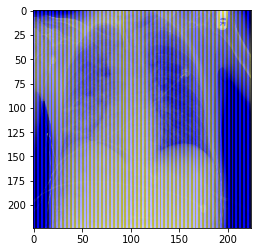

Progress 5700/26681
Saving 519eb46c-4578-43c5-82c7-c3dfe6b9b291 as ../rsna-pneumonia-retina/data/with_meta//519eb46c-4578-43c5-82c7-c3dfe6b9b291.png


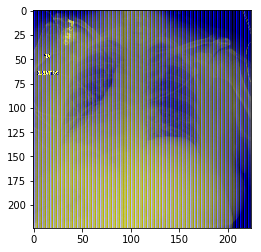

Progress 5800/26681
Saving 527d8008-4454-4ba2-9904-24deb3a46a79 as ../rsna-pneumonia-retina/data/with_meta//527d8008-4454-4ba2-9904-24deb3a46a79.png


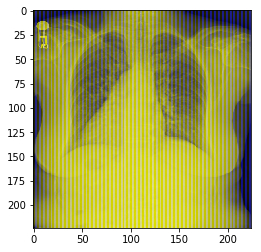

Progress 5900/26681
Saving 535c2337-e755-43ea-ab1d-6547a584776d as ../rsna-pneumonia-retina/data/with_meta//535c2337-e755-43ea-ab1d-6547a584776d.png


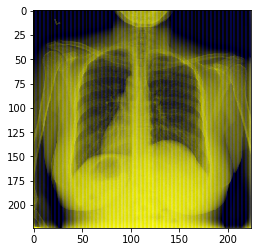

Progress 6000/26681
Saving 54304858-51a2-4310-9b66-aca772db7fb6 as ../rsna-pneumonia-retina/data/with_meta//54304858-51a2-4310-9b66-aca772db7fb6.png


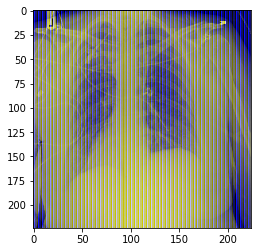

Progress 6100/26681
Saving 54fc4986-daf1-49c9-8309-0be488ebc9f8 as ../rsna-pneumonia-retina/data/with_meta//54fc4986-daf1-49c9-8309-0be488ebc9f8.png


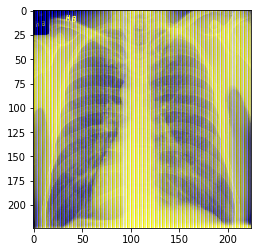

Progress 6200/26681
Saving 55e596a9-102f-4550-a9a4-136a31bf300d as ../rsna-pneumonia-retina/data/with_meta//55e596a9-102f-4550-a9a4-136a31bf300d.png


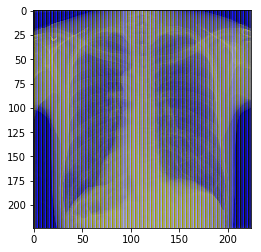

Progress 6300/26681
Saving 56bd9bed-4162-43d9-a3f8-dfdacfeb78e9 as ../rsna-pneumonia-retina/data/with_meta//56bd9bed-4162-43d9-a3f8-dfdacfeb78e9.png


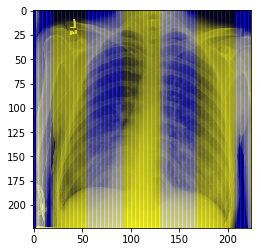

Progress 6400/26681
Saving 57a3fc91-15bd-4967-b617-d4716affd388 as ../rsna-pneumonia-retina/data/with_meta//57a3fc91-15bd-4967-b617-d4716affd388.png


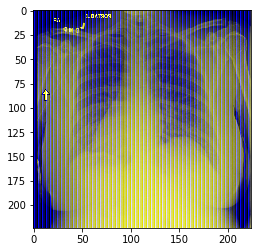

Progress 6500/26681
Saving 5885c03d-7eb8-4472-8ad1-646e7d41fd48 as ../rsna-pneumonia-retina/data/with_meta//5885c03d-7eb8-4472-8ad1-646e7d41fd48.png


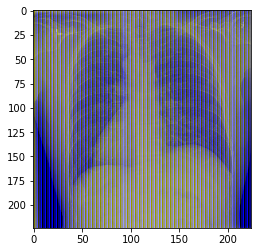

Progress 6600/26681
Saving 595d455b-2563-4e7b-9915-e22aa9b5b287 as ../rsna-pneumonia-retina/data/with_meta//595d455b-2563-4e7b-9915-e22aa9b5b287.png


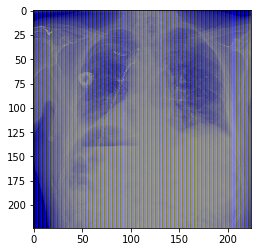

Progress 6700/26681
Saving 5a5ca5cf-9497-4112-a8e6-6090bf7f5dcb as ../rsna-pneumonia-retina/data/with_meta//5a5ca5cf-9497-4112-a8e6-6090bf7f5dcb.png


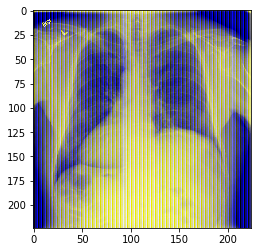

Progress 6800/26681
Saving 5b4e3c38-8b12-42ab-99fc-9b8d31f40b38 as ../rsna-pneumonia-retina/data/with_meta//5b4e3c38-8b12-42ab-99fc-9b8d31f40b38.png


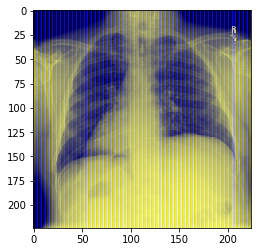

Progress 6900/26681
Saving 5c310518-3c5a-4e88-a2ca-fa2a267ecc8d as ../rsna-pneumonia-retina/data/with_meta//5c310518-3c5a-4e88-a2ca-fa2a267ecc8d.png


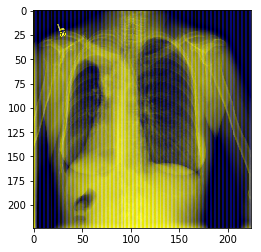

Progress 7000/26681
Saving 5d1d1eb6-1c43-416e-b280-7aa689c4589a as ../rsna-pneumonia-retina/data/with_meta//5d1d1eb6-1c43-416e-b280-7aa689c4589a.png


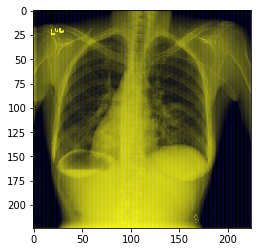

Progress 7100/26681
Saving 5df55e51-37f2-4f1c-bd52-70b442b92f92 as ../rsna-pneumonia-retina/data/with_meta//5df55e51-37f2-4f1c-bd52-70b442b92f92.png


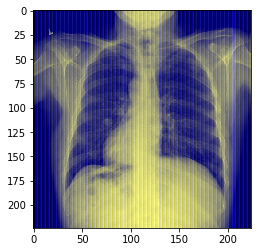

Progress 7200/26681
Saving 5ece4312-3c69-4f5a-ae79-33617b290219 as ../rsna-pneumonia-retina/data/with_meta//5ece4312-3c69-4f5a-ae79-33617b290219.png


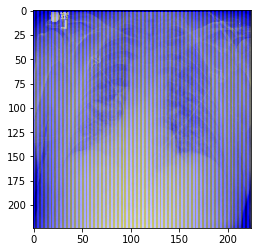

Progress 7300/26681
Saving 5fa389a4-8c9f-4971-8a87-c2fa2f668d12 as ../rsna-pneumonia-retina/data/with_meta//5fa389a4-8c9f-4971-8a87-c2fa2f668d12.png


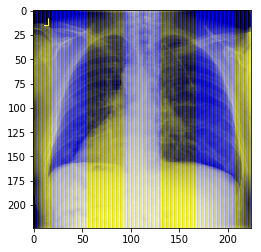

Progress 7400/26681
Saving 607fe277-69f8-4958-bc45-4ecf5ebdfa07 as ../rsna-pneumonia-retina/data/with_meta//607fe277-69f8-4958-bc45-4ecf5ebdfa07.png


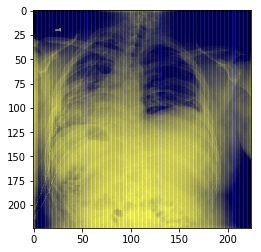

Progress 7500/26681
Saving 615faf3d-7097-4b8a-a131-3b1d29cae868 as ../rsna-pneumonia-retina/data/with_meta//615faf3d-7097-4b8a-a131-3b1d29cae868.png


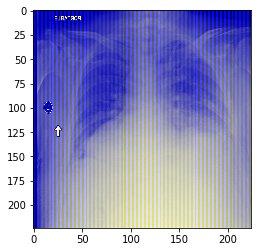

Progress 7600/26681
Saving 6258b428-045c-40a3-b556-b2b3c83110f3 as ../rsna-pneumonia-retina/data/with_meta//6258b428-045c-40a3-b556-b2b3c83110f3.png


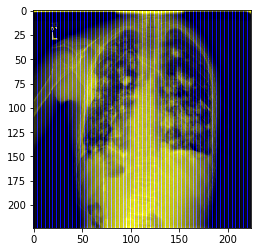

Progress 7700/26681
Saving 6326e2e5-d349-42e2-b42e-8dd63bc40d19 as ../rsna-pneumonia-retina/data/with_meta//6326e2e5-d349-42e2-b42e-8dd63bc40d19.png


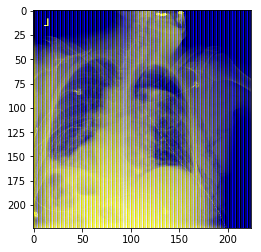

Progress 7800/26681
Saving 63fe1ae4-bd2d-4777-9dfc-8683aba56460 as ../rsna-pneumonia-retina/data/with_meta//63fe1ae4-bd2d-4777-9dfc-8683aba56460.png


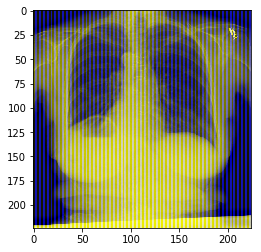

Progress 7900/26681
Saving 64c717c5-62f8-4434-b967-350679a2d4b9 as ../rsna-pneumonia-retina/data/with_meta//64c717c5-62f8-4434-b967-350679a2d4b9.png


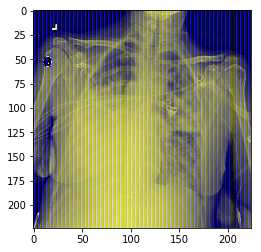

Progress 8000/26681
Saving 658da350-aa7a-4a04-b084-43a89e53259d as ../rsna-pneumonia-retina/data/with_meta//658da350-aa7a-4a04-b084-43a89e53259d.png


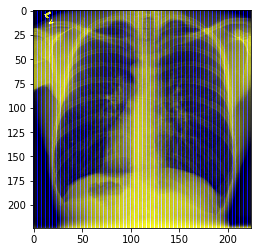

Progress 8100/26681
Saving 666a08b6-a4e2-4dc0-ad8d-122d609e6188 as ../rsna-pneumonia-retina/data/with_meta//666a08b6-a4e2-4dc0-ad8d-122d609e6188.png


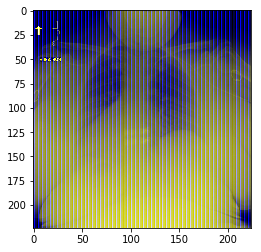

Progress 8200/26681
Saving 6712b830-bb81-4536-8145-3ec571b860bf as ../rsna-pneumonia-retina/data/with_meta//6712b830-bb81-4536-8145-3ec571b860bf.png


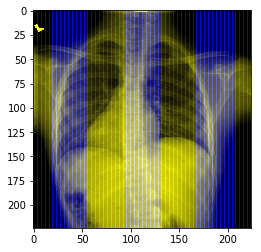

Progress 8300/26681
Saving 67fccd05-4abf-4e40-a74a-f9e6e15288b7 as ../rsna-pneumonia-retina/data/with_meta//67fccd05-4abf-4e40-a74a-f9e6e15288b7.png


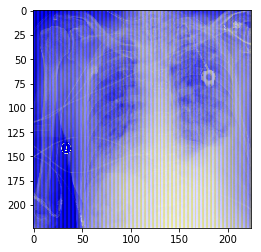

Progress 8400/26681
Saving 68fdc6d0-bec2-4ef5-be57-21a825e1d873 as ../rsna-pneumonia-retina/data/with_meta//68fdc6d0-bec2-4ef5-be57-21a825e1d873.png


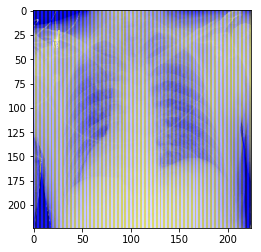

Progress 8500/26681
Saving 69affe5b-c780-4488-8e0b-4de2e1c014d5 as ../rsna-pneumonia-retina/data/with_meta//69affe5b-c780-4488-8e0b-4de2e1c014d5.png


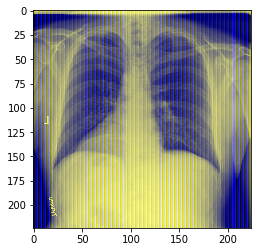

Progress 8600/26681
Saving 6a7ad59c-c9fc-435b-9e41-844a9477c6d9 as ../rsna-pneumonia-retina/data/with_meta//6a7ad59c-c9fc-435b-9e41-844a9477c6d9.png


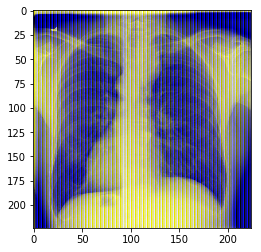

Progress 8700/26681
Saving 6b32fb01-46ea-465d-a0aa-21fa8583b230 as ../rsna-pneumonia-retina/data/with_meta//6b32fb01-46ea-465d-a0aa-21fa8583b230.png


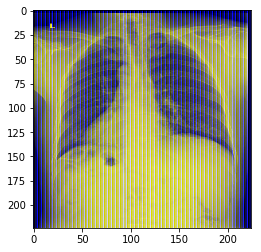

Progress 8800/26681
Saving 6bf5b78a-635b-48f2-b767-460711927d7f as ../rsna-pneumonia-retina/data/with_meta//6bf5b78a-635b-48f2-b767-460711927d7f.png


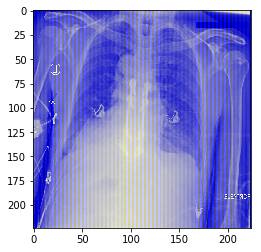

Progress 8900/26681
Saving 6cbc978a-50ee-46b4-b0b7-5201b50d19b5 as ../rsna-pneumonia-retina/data/with_meta//6cbc978a-50ee-46b4-b0b7-5201b50d19b5.png


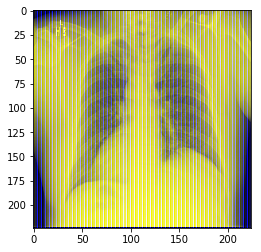

Progress 9000/26681
Saving 6db53e07-4656-47e7-bed7-5782fd117f91 as ../rsna-pneumonia-retina/data/with_meta//6db53e07-4656-47e7-bed7-5782fd117f91.png


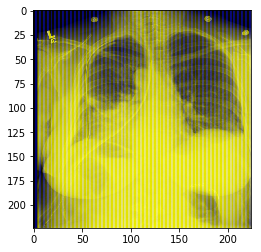

Progress 9100/26681
Saving 6e75f4ed-46b1-49ff-bae2-e389adc9e6e6 as ../rsna-pneumonia-retina/data/with_meta//6e75f4ed-46b1-49ff-bae2-e389adc9e6e6.png


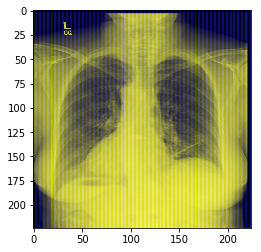

Progress 9200/26681
Saving 6f41f78b-66db-40eb-b657-e07470a50d24 as ../rsna-pneumonia-retina/data/with_meta//6f41f78b-66db-40eb-b657-e07470a50d24.png


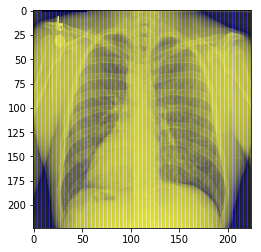

Progress 9300/26681
Saving 703bcb21-559a-4c64-9d9b-6ff164c06218 as ../rsna-pneumonia-retina/data/with_meta//703bcb21-559a-4c64-9d9b-6ff164c06218.png


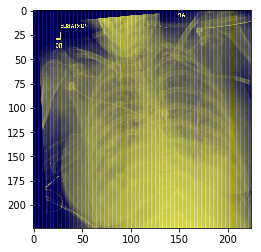

Progress 9400/26681
Saving 71131596-6768-4832-a4b4-5b7a1478d060 as ../rsna-pneumonia-retina/data/with_meta//71131596-6768-4832-a4b4-5b7a1478d060.png


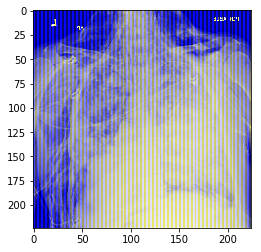

Progress 9500/26681
Saving 71d57bca-9142-4f4d-b35d-7c6d1da6ed6c as ../rsna-pneumonia-retina/data/with_meta//71d57bca-9142-4f4d-b35d-7c6d1da6ed6c.png


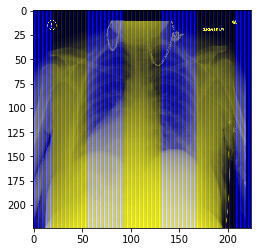

Progress 9600/26681
Saving 72a2d10b-cc88-433c-b988-8013f7530d99 as ../rsna-pneumonia-retina/data/with_meta//72a2d10b-cc88-433c-b988-8013f7530d99.png


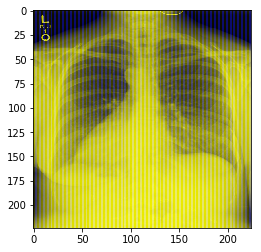

Progress 9700/26681
Saving 73a53464-7183-4a5e-ba1d-f2c014d1511a as ../rsna-pneumonia-retina/data/with_meta//73a53464-7183-4a5e-ba1d-f2c014d1511a.png


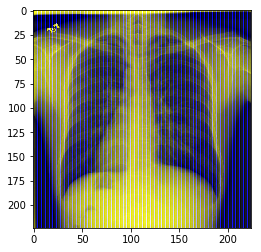

Progress 9800/26681
Saving 7471b2a3-12dd-48dd-a43c-04c4718e5e20 as ../rsna-pneumonia-retina/data/with_meta//7471b2a3-12dd-48dd-a43c-04c4718e5e20.png


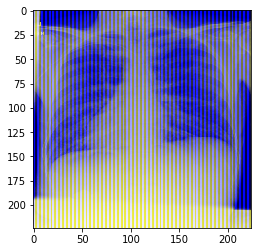

Progress 9900/26681
Saving 755233cd-2ad2-4cbc-b927-97243e46135f as ../rsna-pneumonia-retina/data/with_meta//755233cd-2ad2-4cbc-b927-97243e46135f.png


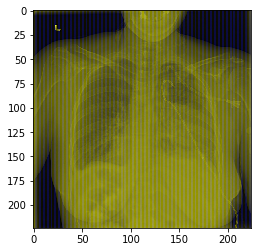

Progress 10000/26681
Saving 762f405c-b9fc-4b1c-abf0-a6c5a3f92b16 as ../rsna-pneumonia-retina/data/with_meta//762f405c-b9fc-4b1c-abf0-a6c5a3f92b16.png


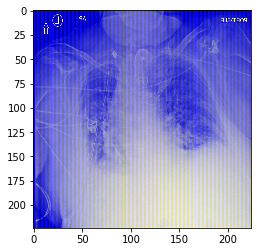

Progress 10100/26681
Saving 77252ca8-2220-41ad-bb30-f4be1fbc7b5a as ../rsna-pneumonia-retina/data/with_meta//77252ca8-2220-41ad-bb30-f4be1fbc7b5a.png


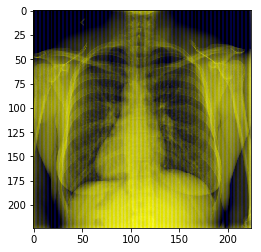

Progress 10200/26681
Saving 7820e3bb-b904-4d1f-ab4a-2822209e62ee as ../rsna-pneumonia-retina/data/with_meta//7820e3bb-b904-4d1f-ab4a-2822209e62ee.png


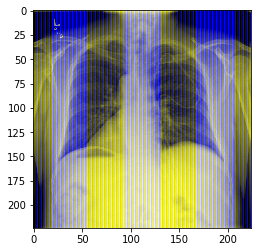

Progress 10300/26681
Saving 78df2b9e-8339-45fc-bbeb-d53467f8d4e2 as ../rsna-pneumonia-retina/data/with_meta//78df2b9e-8339-45fc-bbeb-d53467f8d4e2.png


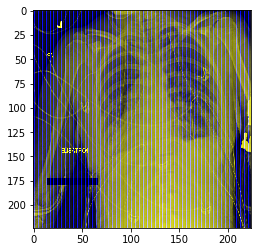

Progress 10400/26681
Saving 79c9fdcb-4b15-4e11-8d8a-30fac6bbca58 as ../rsna-pneumonia-retina/data/with_meta//79c9fdcb-4b15-4e11-8d8a-30fac6bbca58.png


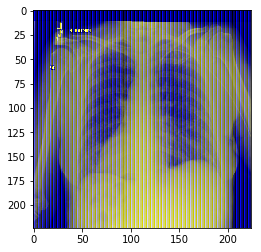

Progress 10500/26681
Saving 7ab63c3b-213b-44c5-9df4-1b98ee94d252 as ../rsna-pneumonia-retina/data/with_meta//7ab63c3b-213b-44c5-9df4-1b98ee94d252.png


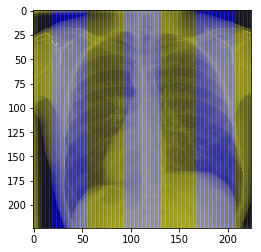

Progress 10600/26681
Saving 7ba1d5c0-f020-4c37-ba00-f1d308278c97 as ../rsna-pneumonia-retina/data/with_meta//7ba1d5c0-f020-4c37-ba00-f1d308278c97.png


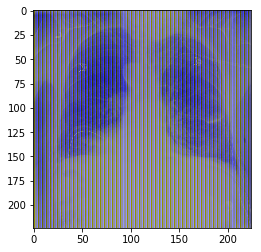

Progress 10700/26681
Saving 7c62e839-540a-4c2f-8ee8-ea6f3c4c4dfe as ../rsna-pneumonia-retina/data/with_meta//7c62e839-540a-4c2f-8ee8-ea6f3c4c4dfe.png


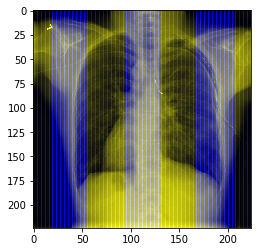

Progress 10800/26681
Saving 7d466157-3f63-4b48-8339-6fc223cb6393 as ../rsna-pneumonia-retina/data/with_meta//7d466157-3f63-4b48-8339-6fc223cb6393.png


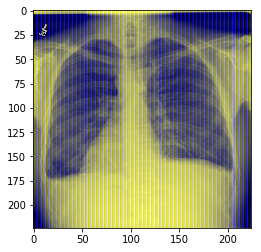

Progress 10900/26681
Saving 7e30d243-74d1-4ead-8c47-be631669b1ae as ../rsna-pneumonia-retina/data/with_meta//7e30d243-74d1-4ead-8c47-be631669b1ae.png


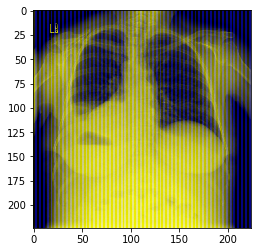

Progress 11000/26681
Saving 7f05b70f-2ad0-4db6-9e05-6c2baec8cd52 as ../rsna-pneumonia-retina/data/with_meta//7f05b70f-2ad0-4db6-9e05-6c2baec8cd52.png


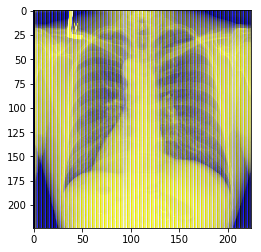

Progress 11100/26681
Saving 7fc478ab-7eca-454d-885c-6aec22dc6903 as ../rsna-pneumonia-retina/data/with_meta//7fc478ab-7eca-454d-885c-6aec22dc6903.png


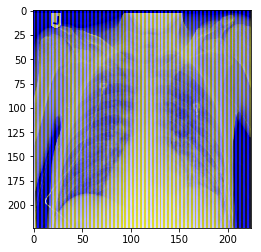

Progress 11200/26681
Saving 80a5c4a8-ce44-444e-a778-e6d374a39e59 as ../rsna-pneumonia-retina/data/with_meta//80a5c4a8-ce44-444e-a778-e6d374a39e59.png


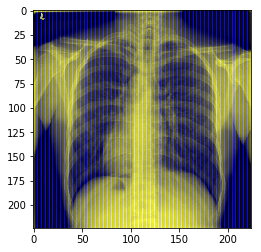

Progress 11300/26681
Saving 81a6a632-7899-40d6-83f0-a8b303d6c9a2 as ../rsna-pneumonia-retina/data/with_meta//81a6a632-7899-40d6-83f0-a8b303d6c9a2.png


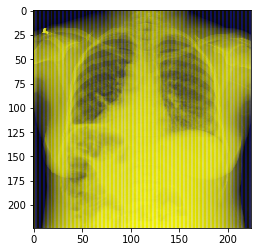

Progress 11400/26681
Saving 828fd0fb-4220-4e6d-a0af-dcb15ef43973 as ../rsna-pneumonia-retina/data/with_meta//828fd0fb-4220-4e6d-a0af-dcb15ef43973.png


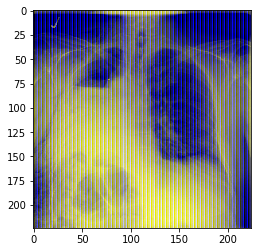

Progress 11500/26681
Saving 8375abca-b2a0-4d2f-8672-002f89276a4e as ../rsna-pneumonia-retina/data/with_meta//8375abca-b2a0-4d2f-8672-002f89276a4e.png


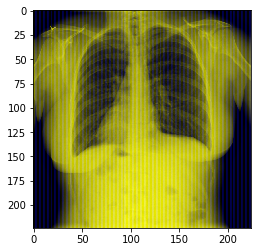

Progress 11600/26681
Saving 849217ad-5cb2-4a87-9796-420b69722b14 as ../rsna-pneumonia-retina/data/with_meta//849217ad-5cb2-4a87-9796-420b69722b14.png


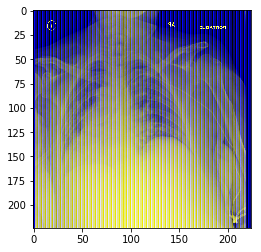

Progress 11700/26681
Saving 85972891-949d-457f-9eef-4d9af6943b64 as ../rsna-pneumonia-retina/data/with_meta//85972891-949d-457f-9eef-4d9af6943b64.png


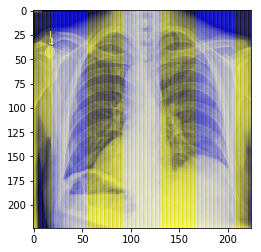

Progress 11800/26681
Saving 86936d5f-73fb-462e-bcbc-5815879cb3d6 as ../rsna-pneumonia-retina/data/with_meta//86936d5f-73fb-462e-bcbc-5815879cb3d6.png


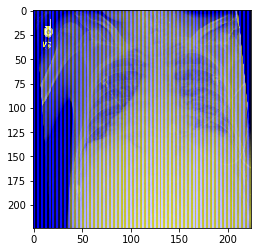

Progress 11900/26681
Saving 876bef9f-d3c8-46e3-bb6a-15d36dce2c21 as ../rsna-pneumonia-retina/data/with_meta//876bef9f-d3c8-46e3-bb6a-15d36dce2c21.png


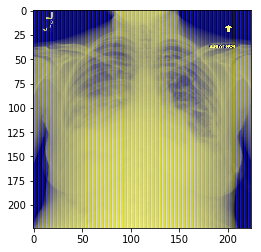

Progress 12000/26681
Saving 88522719-8558-4845-8e97-38ce464908fd as ../rsna-pneumonia-retina/data/with_meta//88522719-8558-4845-8e97-38ce464908fd.png


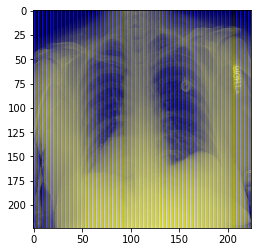

Progress 12100/26681
Saving 8949f382-c28f-462b-a902-058818235e3b as ../rsna-pneumonia-retina/data/with_meta//8949f382-c28f-462b-a902-058818235e3b.png


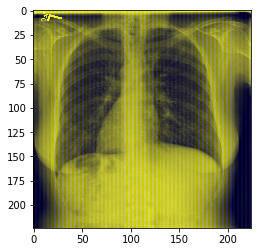

Progress 12200/26681
Saving 8a225736-714d-489a-9cb5-ef44f4c09774 as ../rsna-pneumonia-retina/data/with_meta//8a225736-714d-489a-9cb5-ef44f4c09774.png


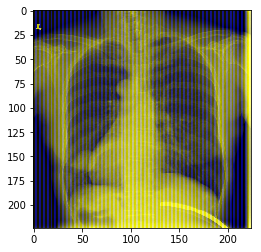

Progress 12300/26681
Saving 8afcd52a-ec76-40b8-8064-29ee17efd5b9 as ../rsna-pneumonia-retina/data/with_meta//8afcd52a-ec76-40b8-8064-29ee17efd5b9.png


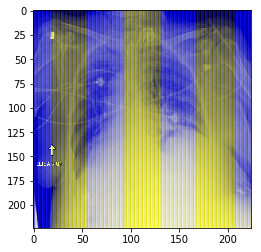

Progress 12400/26681
Saving 8bcd3888-211a-405d-8381-fa46bb068826 as ../rsna-pneumonia-retina/data/with_meta//8bcd3888-211a-405d-8381-fa46bb068826.png


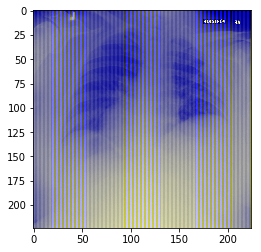

Progress 12500/26681
Saving 8cb60caf-4252-4a22-8417-142b13ceff79 as ../rsna-pneumonia-retina/data/with_meta//8cb60caf-4252-4a22-8417-142b13ceff79.png


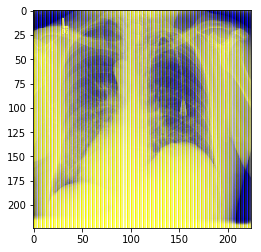

Progress 12600/26681
Saving 8d8f6fdd-ea73-42b8-bbda-a9f0bb76bb9e as ../rsna-pneumonia-retina/data/with_meta//8d8f6fdd-ea73-42b8-bbda-a9f0bb76bb9e.png


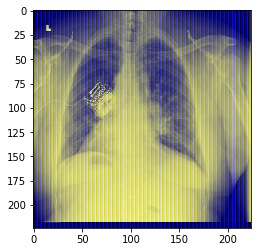

Progress 12700/26681
Saving 8e67f906-1ff2-40a8-8ea1-c5b4887ce2bf as ../rsna-pneumonia-retina/data/with_meta//8e67f906-1ff2-40a8-8ea1-c5b4887ce2bf.png


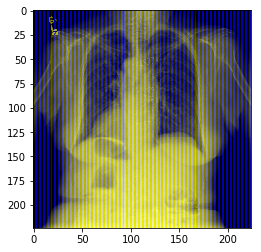

Progress 12800/26681
Saving 8f3aa552-04b9-42b9-8659-9e13e2a9832e as ../rsna-pneumonia-retina/data/with_meta//8f3aa552-04b9-42b9-8659-9e13e2a9832e.png


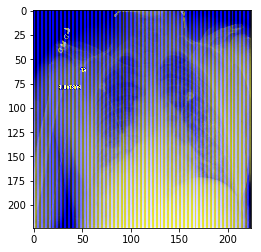

Progress 12900/26681
Saving 901c9f79-f402-4468-904b-29d1d0155384 as ../rsna-pneumonia-retina/data/with_meta//901c9f79-f402-4468-904b-29d1d0155384.png


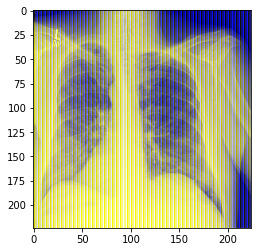

Progress 13000/26681
Saving 911fda2d-a2c6-4344-bc56-a42fdf3c1058 as ../rsna-pneumonia-retina/data/with_meta//911fda2d-a2c6-4344-bc56-a42fdf3c1058.png


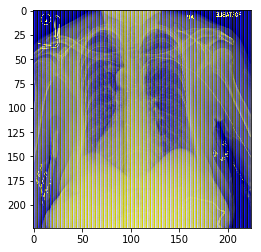

Progress 13100/26681
Saving 91ffea2c-cabd-4e92-9250-9498ecbd424c as ../rsna-pneumonia-retina/data/with_meta//91ffea2c-cabd-4e92-9250-9498ecbd424c.png


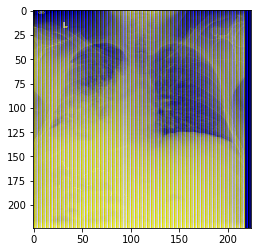

Progress 13200/26681
Saving 930d83dd-cd4c-4968-a94e-581903c2cd76 as ../rsna-pneumonia-retina/data/with_meta//930d83dd-cd4c-4968-a94e-581903c2cd76.png


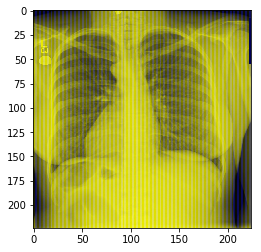

Progress 13300/26681
Saving 93caa1a4-e457-4ac5-b1e3-c1b7cdfdac50 as ../rsna-pneumonia-retina/data/with_meta//93caa1a4-e457-4ac5-b1e3-c1b7cdfdac50.png


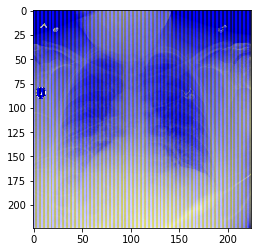

Progress 13400/26681
Saving 94b95919-9eae-4049-a578-7803f8e06753 as ../rsna-pneumonia-retina/data/with_meta//94b95919-9eae-4049-a578-7803f8e06753.png


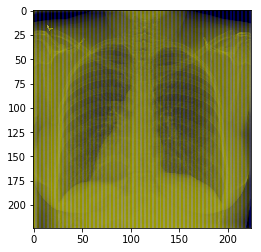

Progress 13500/26681
Saving 95b0497b-b776-460c-9746-b89779eaee45 as ../rsna-pneumonia-retina/data/with_meta//95b0497b-b776-460c-9746-b89779eaee45.png


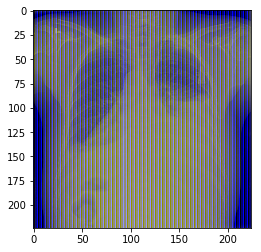

Progress 13600/26681
Saving 96891c2a-753b-468d-bba1-610cfb7b7687 as ../rsna-pneumonia-retina/data/with_meta//96891c2a-753b-468d-bba1-610cfb7b7687.png


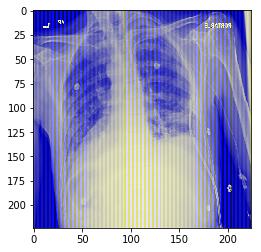

Progress 13700/26681
Saving 9779f8e2-a2b0-4673-9ff8-4890bc26bd20 as ../rsna-pneumonia-retina/data/with_meta//9779f8e2-a2b0-4673-9ff8-4890bc26bd20.png


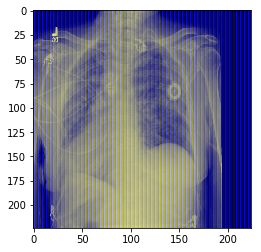

Progress 13800/26681
Saving 984afed3-af7c-45d3-b202-4788f9522b28 as ../rsna-pneumonia-retina/data/with_meta//984afed3-af7c-45d3-b202-4788f9522b28.png


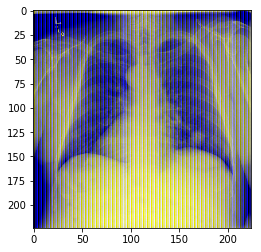

Progress 13900/26681
Saving 99123af8-6f47-4ce0-8e8c-1d730bd44c77 as ../rsna-pneumonia-retina/data/with_meta//99123af8-6f47-4ce0-8e8c-1d730bd44c77.png


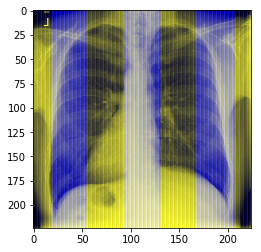

Progress 14000/26681
Saving 99d72abd-78dd-4a09-8f9f-d07478196760 as ../rsna-pneumonia-retina/data/with_meta//99d72abd-78dd-4a09-8f9f-d07478196760.png


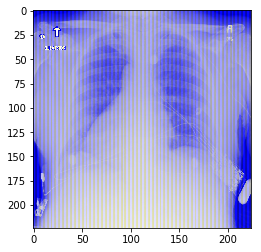

Progress 14100/26681
Saving 9aa71e73-be35-4de7-8709-a3c53b936db1 as ../rsna-pneumonia-retina/data/with_meta//9aa71e73-be35-4de7-8709-a3c53b936db1.png


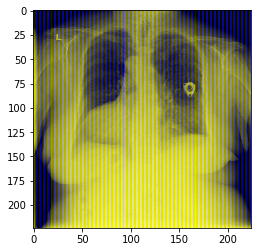

Progress 14200/26681
Saving 9ba07590-ba44-4413-b5da-6781d4c051b3 as ../rsna-pneumonia-retina/data/with_meta//9ba07590-ba44-4413-b5da-6781d4c051b3.png


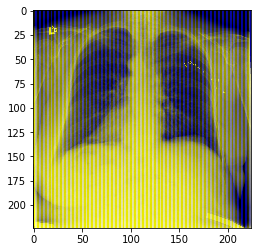

Progress 14300/26681
Saving 9c8a72e1-b484-41a0-937a-f24a92053e7a as ../rsna-pneumonia-retina/data/with_meta//9c8a72e1-b484-41a0-937a-f24a92053e7a.png


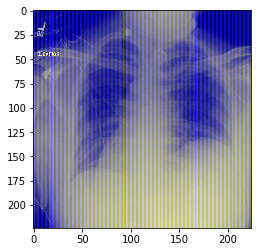

Progress 14400/26681
Saving 9d98164c-1834-4fd6-b423-0b3ca79852ad as ../rsna-pneumonia-retina/data/with_meta//9d98164c-1834-4fd6-b423-0b3ca79852ad.png


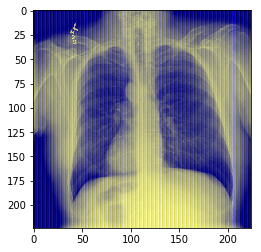

Progress 14500/26681
Saving 9e7ccb65-2088-49c2-b05f-9216c9871282 as ../rsna-pneumonia-retina/data/with_meta//9e7ccb65-2088-49c2-b05f-9216c9871282.png


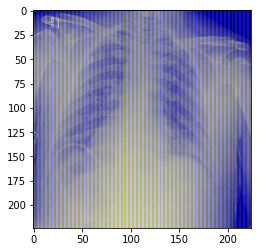

Progress 14600/26681
Saving 9f3f5192-ef06-4085-bfbe-17ec62087fd4 as ../rsna-pneumonia-retina/data/with_meta//9f3f5192-ef06-4085-bfbe-17ec62087fd4.png


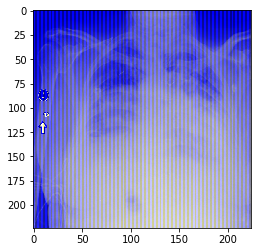

Progress 14700/26681
Saving a01997aa-d69a-435b-a000-c0c7b59dd97b as ../rsna-pneumonia-retina/data/with_meta//a01997aa-d69a-435b-a000-c0c7b59dd97b.png


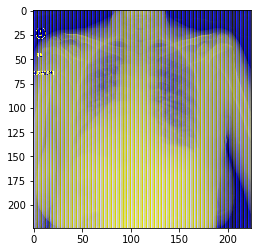

Progress 14800/26681
Saving a102ee89-3806-4b01-ab43-fb39cc14944d as ../rsna-pneumonia-retina/data/with_meta//a102ee89-3806-4b01-ab43-fb39cc14944d.png


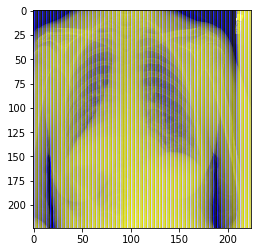

Progress 14900/26681
Saving a1c95a73-d5f7-42b3-9966-682b072c9fea as ../rsna-pneumonia-retina/data/with_meta//a1c95a73-d5f7-42b3-9966-682b072c9fea.png


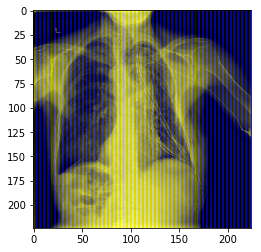

Progress 15000/26681
Saving a2c5e272-b2d0-429e-ba46-75634658d19b as ../rsna-pneumonia-retina/data/with_meta//a2c5e272-b2d0-429e-ba46-75634658d19b.png


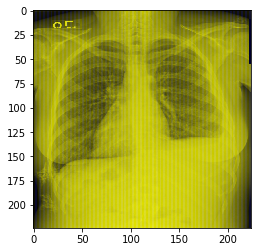

Progress 15100/26681
Saving a391b63d-c95d-41c3-9047-4f337e09add1 as ../rsna-pneumonia-retina/data/with_meta//a391b63d-c95d-41c3-9047-4f337e09add1.png


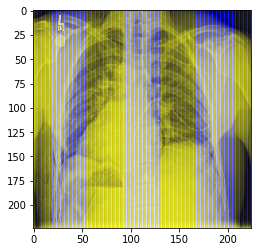

Progress 15200/26681
Saving a46a6f15-73a7-44f6-8604-b585539e94b3 as ../rsna-pneumonia-retina/data/with_meta//a46a6f15-73a7-44f6-8604-b585539e94b3.png


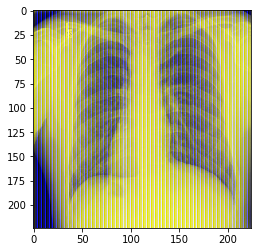

Progress 15300/26681
Saving a51ffe46-62bd-448b-8e8f-b32c2b08011c as ../rsna-pneumonia-retina/data/with_meta//a51ffe46-62bd-448b-8e8f-b32c2b08011c.png


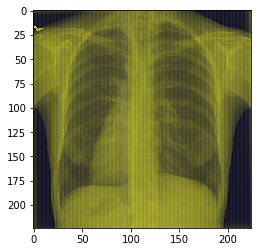

Progress 15400/26681
Saving a5fc5c4e-57b6-49d9-86ee-7ebdf0710562 as ../rsna-pneumonia-retina/data/with_meta//a5fc5c4e-57b6-49d9-86ee-7ebdf0710562.png


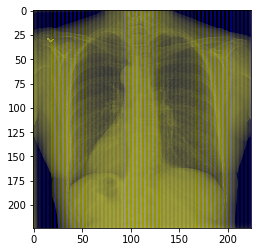

Progress 15500/26681
Saving a6cbb3dd-75ab-4671-a6b0-9a51c04a81ec as ../rsna-pneumonia-retina/data/with_meta//a6cbb3dd-75ab-4671-a6b0-9a51c04a81ec.png


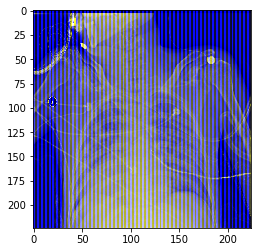

Progress 15600/26681
Saving a7a52ab5-c475-4acc-bbd2-8f1931425cd0 as ../rsna-pneumonia-retina/data/with_meta//a7a52ab5-c475-4acc-bbd2-8f1931425cd0.png


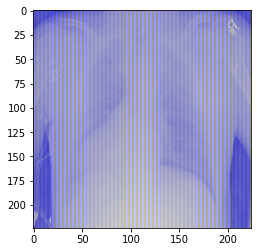

Progress 15700/26681
Saving a8860ea6-3b22-46d8-a2b5-c9a627fdf408 as ../rsna-pneumonia-retina/data/with_meta//a8860ea6-3b22-46d8-a2b5-c9a627fdf408.png


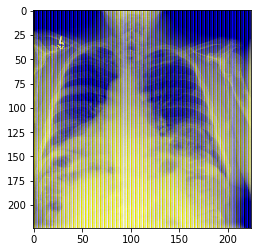

Progress 15800/26681
Saving a9568af2-7ac8-4527-b6c7-f537842685de as ../rsna-pneumonia-retina/data/with_meta//a9568af2-7ac8-4527-b6c7-f537842685de.png


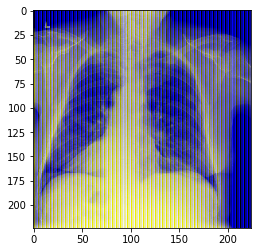

Progress 15900/26681
Saving aa47c55a-7cf7-4105-9132-de080664f052 as ../rsna-pneumonia-retina/data/with_meta//aa47c55a-7cf7-4105-9132-de080664f052.png


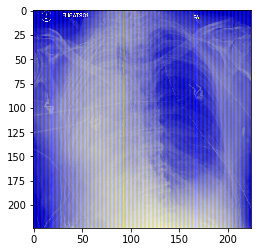

Progress 16000/26681
Saving ab1f2146-1c03-4d96-bc80-d5aaefb9b95d as ../rsna-pneumonia-retina/data/with_meta//ab1f2146-1c03-4d96-bc80-d5aaefb9b95d.png


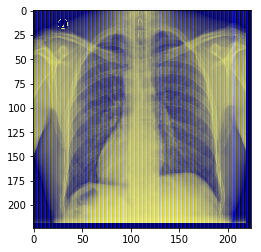

Progress 16100/26681
Saving ac0fa091-cdb3-4e17-a8bd-58545c3e0106 as ../rsna-pneumonia-retina/data/with_meta//ac0fa091-cdb3-4e17-a8bd-58545c3e0106.png


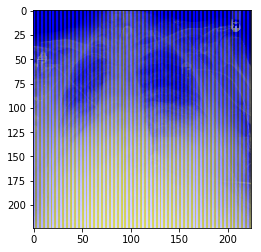

Progress 16200/26681
Saving acdc118f-742d-4e1c-a5b4-f9f052adf54d as ../rsna-pneumonia-retina/data/with_meta//acdc118f-742d-4e1c-a5b4-f9f052adf54d.png


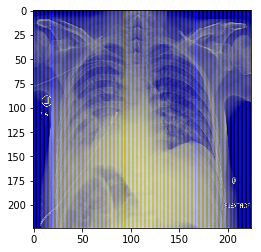

Progress 16300/26681
Saving adc2cce9-624a-4be6-80f4-de648737f6e4 as ../rsna-pneumonia-retina/data/with_meta//adc2cce9-624a-4be6-80f4-de648737f6e4.png


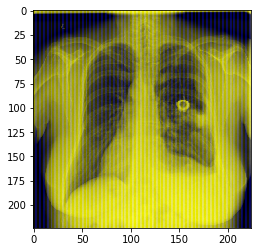

Progress 16400/26681
Saving aea67005-00f8-4c5d-8b0e-782786127ba8 as ../rsna-pneumonia-retina/data/with_meta//aea67005-00f8-4c5d-8b0e-782786127ba8.png


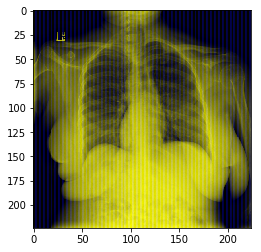

Progress 16500/26681
Saving af83a7a6-dfe2-4419-a4fa-a0090858f8bd as ../rsna-pneumonia-retina/data/with_meta//af83a7a6-dfe2-4419-a4fa-a0090858f8bd.png


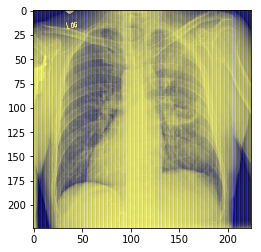

Progress 16600/26681
Saving b057105f-8ea9-49af-97aa-cd6b5b7ba402 as ../rsna-pneumonia-retina/data/with_meta//b057105f-8ea9-49af-97aa-cd6b5b7ba402.png


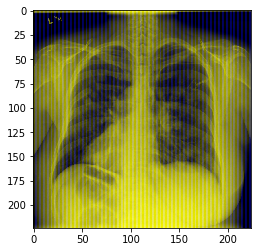

Progress 16700/26681
Saving b12e250e-9e7d-474f-8afd-9546a6ef0afd as ../rsna-pneumonia-retina/data/with_meta//b12e250e-9e7d-474f-8afd-9546a6ef0afd.png


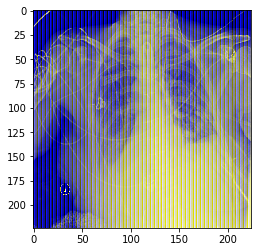

Progress 16800/26681
Saving b1f74e4d-e64a-4555-b60e-8dad24766fd5 as ../rsna-pneumonia-retina/data/with_meta//b1f74e4d-e64a-4555-b60e-8dad24766fd5.png


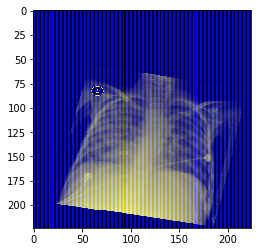

Progress 16900/26681
Saving b2eca3cd-f9cc-46a6-b36a-2902558a7fc4 as ../rsna-pneumonia-retina/data/with_meta//b2eca3cd-f9cc-46a6-b36a-2902558a7fc4.png


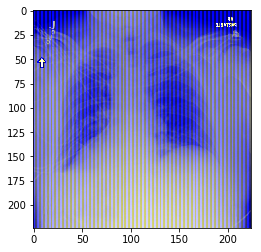

Progress 17000/26681
Saving b3e5becd-9009-4981-82ab-bbf28f4a834b as ../rsna-pneumonia-retina/data/with_meta//b3e5becd-9009-4981-82ab-bbf28f4a834b.png


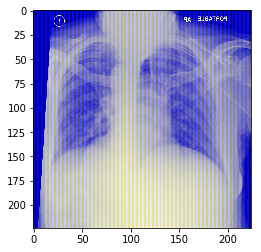

Progress 17100/26681
Saving b49587fd-c948-456d-a393-f6c186978507 as ../rsna-pneumonia-retina/data/with_meta//b49587fd-c948-456d-a393-f6c186978507.png


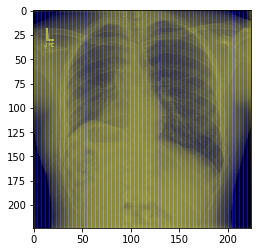

Progress 17200/26681
Saving b5714c0f-6d0f-4c56-833f-8b83f19e982a as ../rsna-pneumonia-retina/data/with_meta//b5714c0f-6d0f-4c56-833f-8b83f19e982a.png


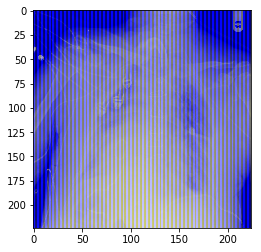

Progress 17300/26681
Saving b6690f38-62b7-4435-bb46-f99a7f3e6e8b as ../rsna-pneumonia-retina/data/with_meta//b6690f38-62b7-4435-bb46-f99a7f3e6e8b.png


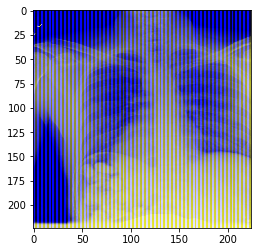

Progress 17400/26681
Saving b75a77fe-d336-4c9f-994f-3d158521fa28 as ../rsna-pneumonia-retina/data/with_meta//b75a77fe-d336-4c9f-994f-3d158521fa28.png


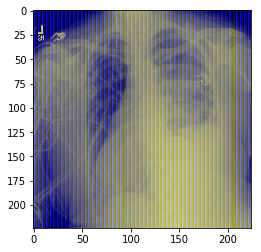

Progress 17500/26681
Saving b82b06e3-bebf-4d9e-a0d9-8f11856049cc as ../rsna-pneumonia-retina/data/with_meta//b82b06e3-bebf-4d9e-a0d9-8f11856049cc.png


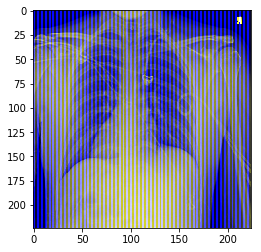

Progress 17600/26681
Saving b927ae22-f24a-456b-bedb-b09416ed10ee as ../rsna-pneumonia-retina/data/with_meta//b927ae22-f24a-456b-bedb-b09416ed10ee.png


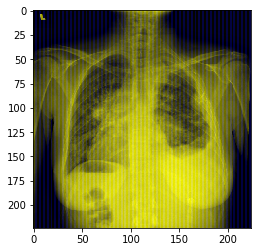

Progress 17700/26681
Saving ba07114f-788c-4779-98cd-1190bfb6bdc2 as ../rsna-pneumonia-retina/data/with_meta//ba07114f-788c-4779-98cd-1190bfb6bdc2.png


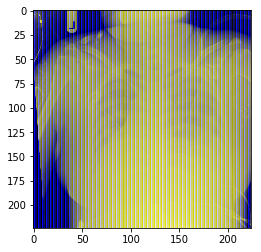

Progress 17800/26681
Saving babf1713-e201-4200-9605-1c483905a9e7 as ../rsna-pneumonia-retina/data/with_meta//babf1713-e201-4200-9605-1c483905a9e7.png


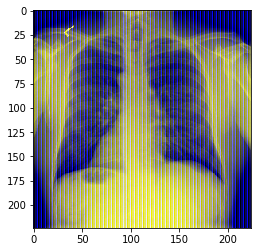

Progress 17900/26681
Saving bb8a43fe-ea85-438e-b20b-894b7d3ae965 as ../rsna-pneumonia-retina/data/with_meta//bb8a43fe-ea85-438e-b20b-894b7d3ae965.png


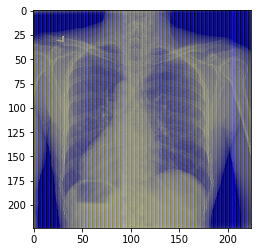

Progress 18000/26681
Saving bc6bcb9d-0907-40e0-9f82-b2fe75091b48 as ../rsna-pneumonia-retina/data/with_meta//bc6bcb9d-0907-40e0-9f82-b2fe75091b48.png


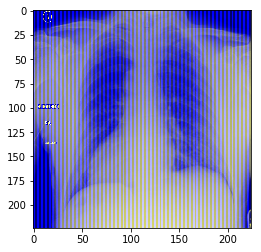

Progress 18100/26681
Saving bd3538a7-5ee0-4b47-bc8b-25743cca1b33 as ../rsna-pneumonia-retina/data/with_meta//bd3538a7-5ee0-4b47-bc8b-25743cca1b33.png


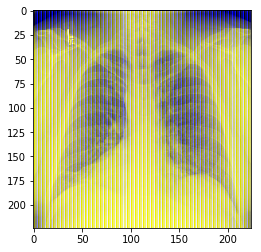

Progress 18200/26681
Saving be108ff0-e920-4b6e-901d-ce8a800f6191 as ../rsna-pneumonia-retina/data/with_meta//be108ff0-e920-4b6e-901d-ce8a800f6191.png


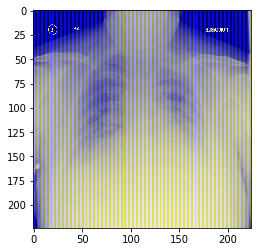

Progress 18300/26681
Saving beee42c2-9e3d-4fd9-a3ba-255743268904 as ../rsna-pneumonia-retina/data/with_meta//beee42c2-9e3d-4fd9-a3ba-255743268904.png


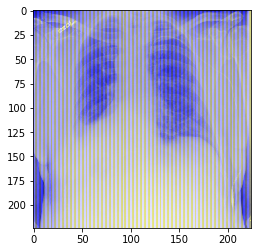

Progress 18400/26681
Saving bfbbedfe-0ab1-42bd-ac7f-e67b2a8e842a as ../rsna-pneumonia-retina/data/with_meta//bfbbedfe-0ab1-42bd-ac7f-e67b2a8e842a.png


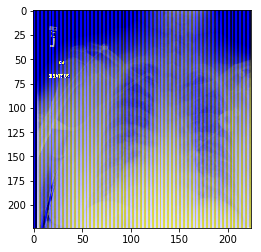

Progress 18500/26681
Saving c23ecec2-d791-42fa-8abf-cb4c447f9c21 as ../rsna-pneumonia-retina/data/with_meta//c23ecec2-d791-42fa-8abf-cb4c447f9c21.png


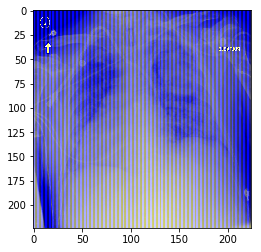

Progress 18600/26681
Saving c319b111-f61f-487e-a02b-444ea13e36ec as ../rsna-pneumonia-retina/data/with_meta//c319b111-f61f-487e-a02b-444ea13e36ec.png


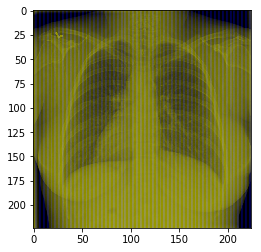

Progress 18700/26681
Saving c3d8007b-6ac3-4a87-897c-f16ebda7a138 as ../rsna-pneumonia-retina/data/with_meta//c3d8007b-6ac3-4a87-897c-f16ebda7a138.png


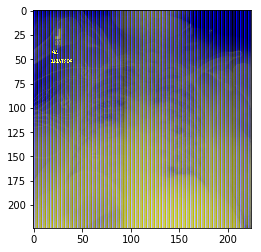

Progress 18800/26681
Saving c4ac804d-a939-4bda-8397-5e7b84cd9431 as ../rsna-pneumonia-retina/data/with_meta//c4ac804d-a939-4bda-8397-5e7b84cd9431.png


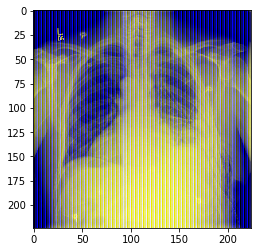

Progress 18900/26681
Saving c574ab19-0055-420c-b96d-5f562f4a019c as ../rsna-pneumonia-retina/data/with_meta//c574ab19-0055-420c-b96d-5f562f4a019c.png


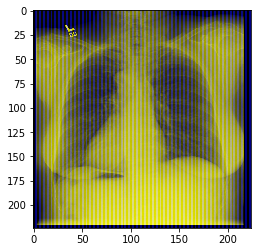

Progress 19000/26681
Saving c63928f7-e5f5-472b-b112-b139b6e8ea08 as ../rsna-pneumonia-retina/data/with_meta//c63928f7-e5f5-472b-b112-b139b6e8ea08.png


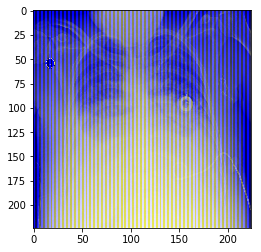

Progress 19100/26681
Saving c742dbd0-c775-4bc5-a2f1-a45d191473ce as ../rsna-pneumonia-retina/data/with_meta//c742dbd0-c775-4bc5-a2f1-a45d191473ce.png


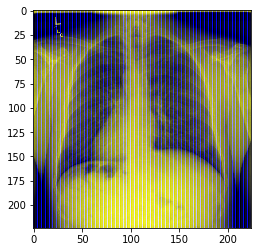

Progress 19200/26681
Saving c7fac87b-f1b1-4945-ba43-305a70c033a5 as ../rsna-pneumonia-retina/data/with_meta//c7fac87b-f1b1-4945-ba43-305a70c033a5.png


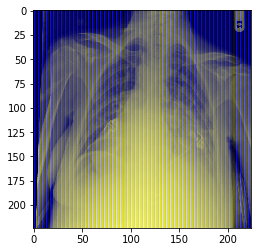

Progress 19300/26681
Saving c8d488eb-1997-4510-8428-1def35b1231a as ../rsna-pneumonia-retina/data/with_meta//c8d488eb-1997-4510-8428-1def35b1231a.png


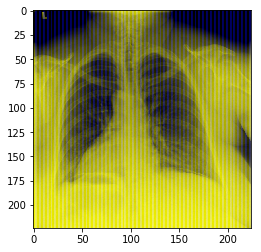

Progress 19400/26681
Saving c9b4ba74-218a-4355-92b6-61a4ea7bb426 as ../rsna-pneumonia-retina/data/with_meta//c9b4ba74-218a-4355-92b6-61a4ea7bb426.png


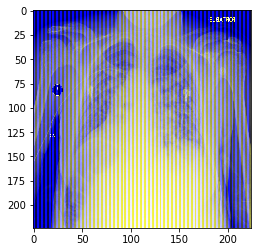

Progress 19500/26681
Saving ca8b395d-7ca0-4dc4-8b56-ff519b4edb89 as ../rsna-pneumonia-retina/data/with_meta//ca8b395d-7ca0-4dc4-8b56-ff519b4edb89.png


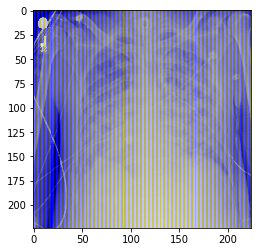

Progress 19600/26681
Saving cb70436a-d8f1-4e8a-91fb-38062ce35758 as ../rsna-pneumonia-retina/data/with_meta//cb70436a-d8f1-4e8a-91fb-38062ce35758.png


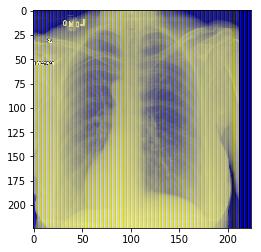

Progress 19700/26681
Saving cc460ad9-7a1a-42c6-aa6d-fbc3ea6f746b as ../rsna-pneumonia-retina/data/with_meta//cc460ad9-7a1a-42c6-aa6d-fbc3ea6f746b.png


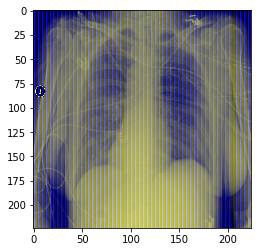

Progress 19800/26681
Saving cd0ca2b5-ec57-41a9-864d-0aab3bf61848 as ../rsna-pneumonia-retina/data/with_meta//cd0ca2b5-ec57-41a9-864d-0aab3bf61848.png


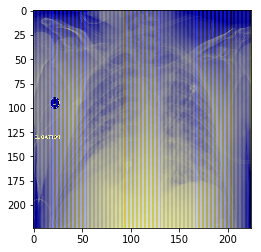

Progress 19900/26681
Saving cdf38d9b-d871-4c34-a589-319491db508c as ../rsna-pneumonia-retina/data/with_meta//cdf38d9b-d871-4c34-a589-319491db508c.png


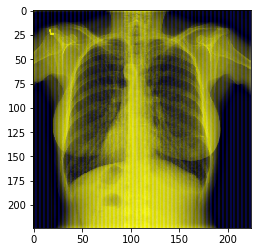

Progress 20000/26681
Saving cee43c92-f71e-4e89-a9b1-cf320da0067e as ../rsna-pneumonia-retina/data/with_meta//cee43c92-f71e-4e89-a9b1-cf320da0067e.png


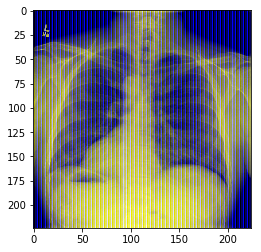

Progress 20100/26681
Saving cfc7e223-b50b-4204-973a-6cabce3072a0 as ../rsna-pneumonia-retina/data/with_meta//cfc7e223-b50b-4204-973a-6cabce3072a0.png


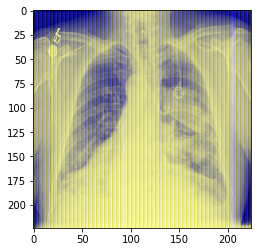

Progress 20200/26681
Saving d0afc8ab-3976-4fe9-a59d-c1f407c96f51 as ../rsna-pneumonia-retina/data/with_meta//d0afc8ab-3976-4fe9-a59d-c1f407c96f51.png


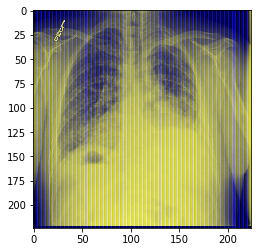

Progress 20300/26681
Saving d184dcdc-ee4e-4ec6-b1a7-bc253e5088b1 as ../rsna-pneumonia-retina/data/with_meta//d184dcdc-ee4e-4ec6-b1a7-bc253e5088b1.png


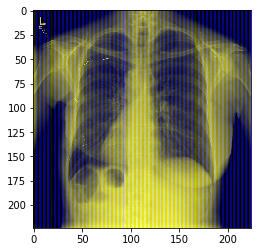

Progress 20400/26681
Saving d2657758-2a6c-44db-8271-16018d87ec00 as ../rsna-pneumonia-retina/data/with_meta//d2657758-2a6c-44db-8271-16018d87ec00.png


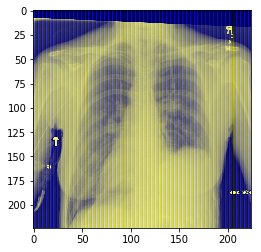

Progress 20500/26681
Saving d3581ff3-8fd6-4058-b5d9-4ce6f0ed0f96 as ../rsna-pneumonia-retina/data/with_meta//d3581ff3-8fd6-4058-b5d9-4ce6f0ed0f96.png


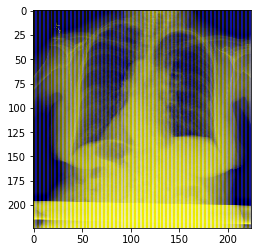

Progress 20600/26681
Saving d46b428d-9c61-4b2e-a0ff-bcc755ed4ffd as ../rsna-pneumonia-retina/data/with_meta//d46b428d-9c61-4b2e-a0ff-bcc755ed4ffd.png


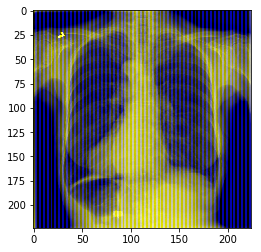

Progress 20700/26681
Saving d5431b84-9bf2-4758-badc-569e71ee1f9a as ../rsna-pneumonia-retina/data/with_meta//d5431b84-9bf2-4758-badc-569e71ee1f9a.png


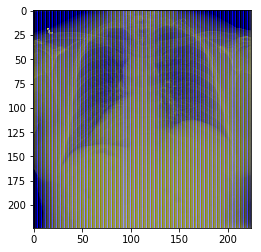

Progress 20800/26681
Saving d623fa91-c7f1-4000-87c7-0b32394cf8bb as ../rsna-pneumonia-retina/data/with_meta//d623fa91-c7f1-4000-87c7-0b32394cf8bb.png


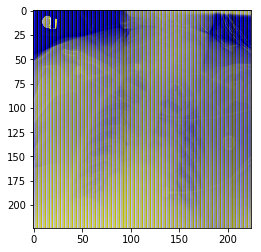

Progress 20900/26681
Saving d6fad98b-6794-45c0-9f12-360c1635d4f1 as ../rsna-pneumonia-retina/data/with_meta//d6fad98b-6794-45c0-9f12-360c1635d4f1.png


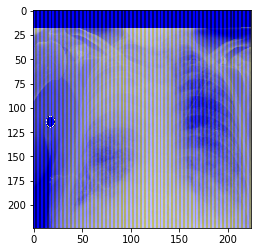

Progress 21000/26681
Saving d7cac31c-73a9-4c8e-ba03-8a4e707b62e0 as ../rsna-pneumonia-retina/data/with_meta//d7cac31c-73a9-4c8e-ba03-8a4e707b62e0.png


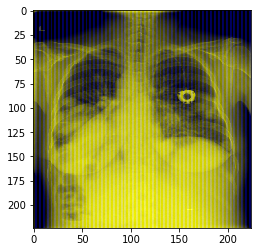

Progress 21100/26681
Saving d8d40e55-c205-4223-bf02-bd7bbafdfc88 as ../rsna-pneumonia-retina/data/with_meta//d8d40e55-c205-4223-bf02-bd7bbafdfc88.png


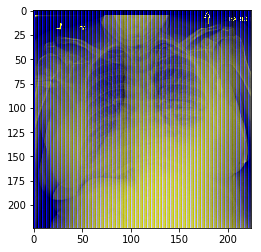

Progress 21200/26681
Saving d995ff97-0cf8-4f17-adab-f23880706cf6 as ../rsna-pneumonia-retina/data/with_meta//d995ff97-0cf8-4f17-adab-f23880706cf6.png


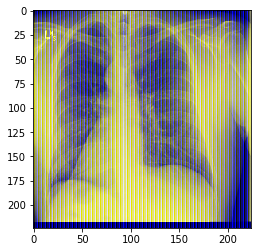

Progress 21300/26681
Saving da8f0bab-c987-4b1d-aedb-f94e9eef6b10 as ../rsna-pneumonia-retina/data/with_meta//da8f0bab-c987-4b1d-aedb-f94e9eef6b10.png


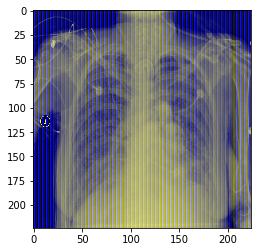

Progress 21400/26681
Saving db754689-fb19-40ce-87dd-e790b3dd2c44 as ../rsna-pneumonia-retina/data/with_meta//db754689-fb19-40ce-87dd-e790b3dd2c44.png


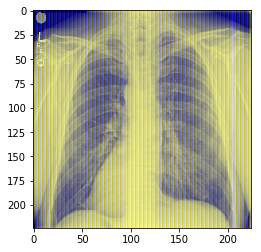

Progress 21500/26681
Saving dc486475-0698-4f27-8b21-5a9eaa0e157f as ../rsna-pneumonia-retina/data/with_meta//dc486475-0698-4f27-8b21-5a9eaa0e157f.png


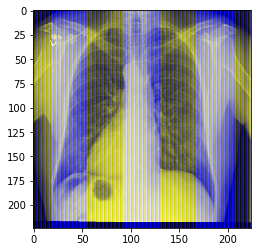

Progress 21600/26681
Saving dd50d374-59d8-4980-8e34-afc060445764 as ../rsna-pneumonia-retina/data/with_meta//dd50d374-59d8-4980-8e34-afc060445764.png


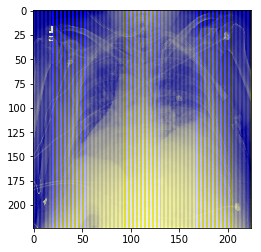

Progress 21700/26681
Saving de2b54b9-114f-4f68-9a5f-4602e843cc31 as ../rsna-pneumonia-retina/data/with_meta//de2b54b9-114f-4f68-9a5f-4602e843cc31.png


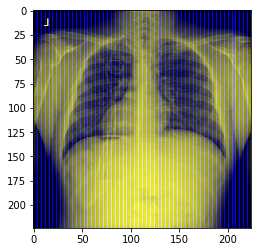

Progress 21800/26681
Saving deffdefd-81f7-4028-a8cd-a4ef500d20e2 as ../rsna-pneumonia-retina/data/with_meta//deffdefd-81f7-4028-a8cd-a4ef500d20e2.png


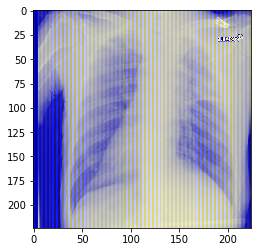

Progress 21900/26681
Saving dff644ef-d0ad-4ae9-8645-7dfa57e523fa as ../rsna-pneumonia-retina/data/with_meta//dff644ef-d0ad-4ae9-8645-7dfa57e523fa.png


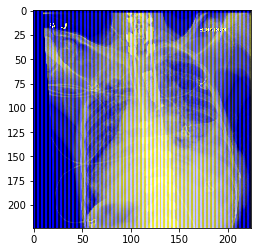

Progress 22000/26681
Saving e0acfc04-c3ac-4017-881d-485ac151dad5 as ../rsna-pneumonia-retina/data/with_meta//e0acfc04-c3ac-4017-881d-485ac151dad5.png


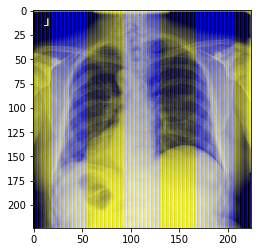

Progress 22100/26681
Saving e18c7203-a029-4cf4-8151-2bc2460c390c as ../rsna-pneumonia-retina/data/with_meta//e18c7203-a029-4cf4-8151-2bc2460c390c.png


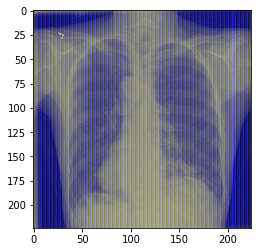

Progress 22200/26681
Saving e275574b-e788-4b08-96ef-2f26a66cca89 as ../rsna-pneumonia-retina/data/with_meta//e275574b-e788-4b08-96ef-2f26a66cca89.png


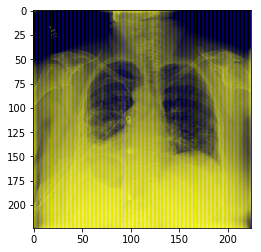

Progress 22300/26681
Saving e34146d8-441f-41fb-88c3-17e747badabe as ../rsna-pneumonia-retina/data/with_meta//e34146d8-441f-41fb-88c3-17e747badabe.png


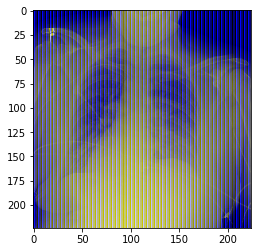

Progress 22400/26681
Saving e42cd993-ebb3-4cc2-b41e-aa2d2a2d1427 as ../rsna-pneumonia-retina/data/with_meta//e42cd993-ebb3-4cc2-b41e-aa2d2a2d1427.png


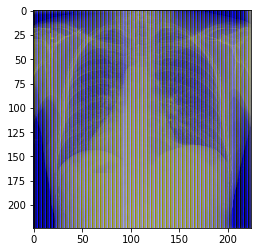

Progress 22500/26681
Saving e4f819e1-1a05-418a-b4aa-e72977e36cde as ../rsna-pneumonia-retina/data/with_meta//e4f819e1-1a05-418a-b4aa-e72977e36cde.png


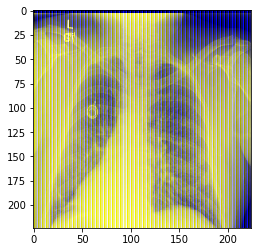

Progress 22600/26681
Saving e5af03f0-ddf9-42a0-b66f-ab5105165bb2 as ../rsna-pneumonia-retina/data/with_meta//e5af03f0-ddf9-42a0-b66f-ab5105165bb2.png


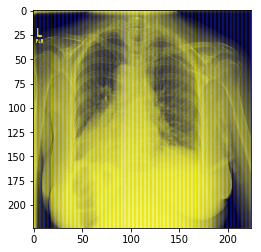

Progress 22700/26681
Saving e6787a0f-e2e2-415b-9962-c844eb2fda6c as ../rsna-pneumonia-retina/data/with_meta//e6787a0f-e2e2-415b-9962-c844eb2fda6c.png


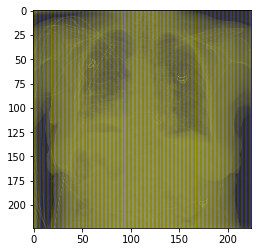

Progress 22800/26681
Saving e755dc4c-11e7-45ff-b07c-3a297a67f0ec as ../rsna-pneumonia-retina/data/with_meta//e755dc4c-11e7-45ff-b07c-3a297a67f0ec.png


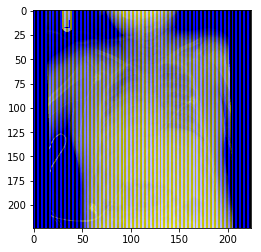

Progress 22900/26681
Saving e8323241-6935-41d0-a3af-5650efd67fe0 as ../rsna-pneumonia-retina/data/with_meta//e8323241-6935-41d0-a3af-5650efd67fe0.png


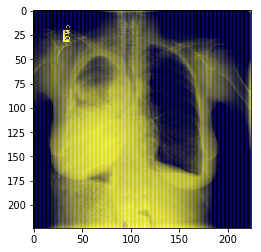

Progress 23000/26681
Saving e92275f0-6120-43c3-9b7c-2ef1d0104358 as ../rsna-pneumonia-retina/data/with_meta//e92275f0-6120-43c3-9b7c-2ef1d0104358.png


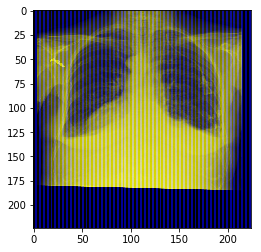

Progress 23100/26681
Saving ea0f76a2-08d3-4273-b9c3-1253483fa647 as ../rsna-pneumonia-retina/data/with_meta//ea0f76a2-08d3-4273-b9c3-1253483fa647.png


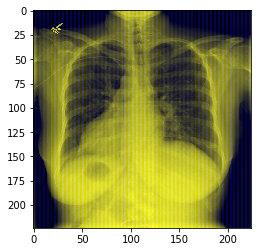

Progress 23200/26681
Saving eadab655-474b-4bdf-9018-0adb6dbed310 as ../rsna-pneumonia-retina/data/with_meta//eadab655-474b-4bdf-9018-0adb6dbed310.png


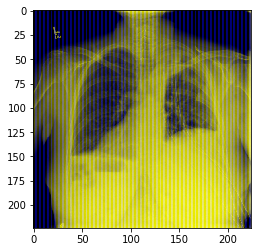

Progress 23300/26681
Saving eba26223-cd3f-4b8b-a4b8-3ebc3922da4f as ../rsna-pneumonia-retina/data/with_meta//eba26223-cd3f-4b8b-a4b8-3ebc3922da4f.png


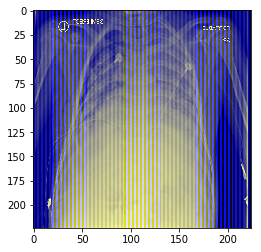

Progress 23400/26681
Saving ec69eb2a-8d24-406c-8b20-6b2528af149d as ../rsna-pneumonia-retina/data/with_meta//ec69eb2a-8d24-406c-8b20-6b2528af149d.png


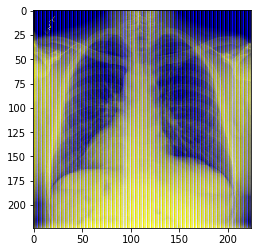

Progress 23500/26681
Saving ed282a1c-7989-4924-9209-61d3e6b30785 as ../rsna-pneumonia-retina/data/with_meta//ed282a1c-7989-4924-9209-61d3e6b30785.png


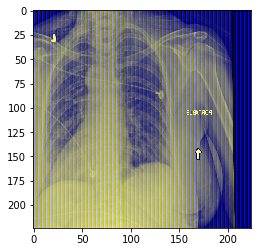

Progress 23600/26681
Saving ee1ca2ec-76be-47f8-9658-c569af9f6dcb as ../rsna-pneumonia-retina/data/with_meta//ee1ca2ec-76be-47f8-9658-c569af9f6dcb.png


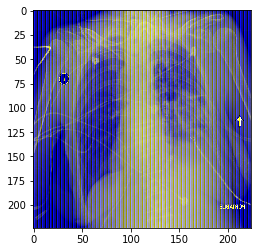

Progress 23700/26681
Saving eef92899-5dc5-4f31-8807-2391f0f88588 as ../rsna-pneumonia-retina/data/with_meta//eef92899-5dc5-4f31-8807-2391f0f88588.png


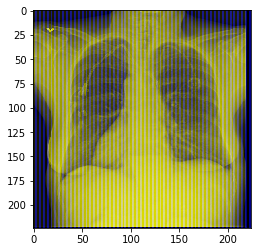

Progress 23800/26681
Saving efd57230-4266-464e-bc6a-7df5f1e83be3 as ../rsna-pneumonia-retina/data/with_meta//efd57230-4266-464e-bc6a-7df5f1e83be3.png


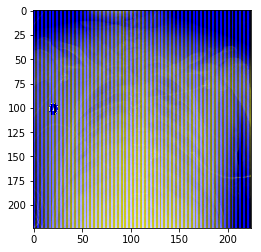

Progress 23900/26681
Saving f0c1a0e1-490e-4ff8-88bb-c71390728cc8 as ../rsna-pneumonia-retina/data/with_meta//f0c1a0e1-490e-4ff8-88bb-c71390728cc8.png


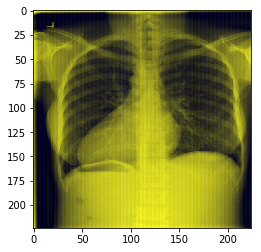

Progress 24000/26681
Saving f1993ea2-413f-4a41-bf31-ec23edc32805 as ../rsna-pneumonia-retina/data/with_meta//f1993ea2-413f-4a41-bf31-ec23edc32805.png


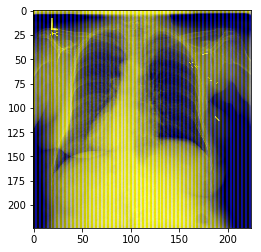

Progress 24100/26681
Saving f263f957-d60f-4ad9-bec8-51c1389afd64 as ../rsna-pneumonia-retina/data/with_meta//f263f957-d60f-4ad9-bec8-51c1389afd64.png


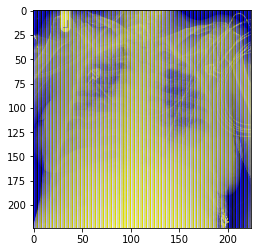

Progress 24200/26681
Saving f33d80d4-83d0-4f00-ab0e-0f5542ad88d2 as ../rsna-pneumonia-retina/data/with_meta//f33d80d4-83d0-4f00-ab0e-0f5542ad88d2.png


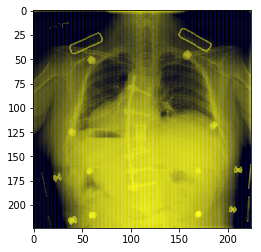

Progress 24300/26681
Saving f4290e1f-6a3b-4691-8e1c-5d721b045964 as ../rsna-pneumonia-retina/data/with_meta//f4290e1f-6a3b-4691-8e1c-5d721b045964.png


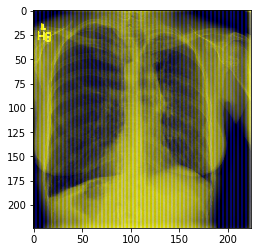

Progress 24400/26681
Saving f5216d65-31e4-4acc-bc14-a49f92ce4793 as ../rsna-pneumonia-retina/data/with_meta//f5216d65-31e4-4acc-bc14-a49f92ce4793.png


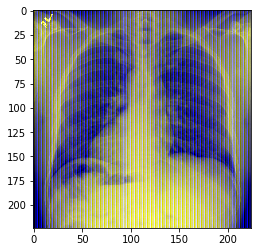

Progress 24500/26681
Saving f5dadf63-c828-441a-b595-ea7698087291 as ../rsna-pneumonia-retina/data/with_meta//f5dadf63-c828-441a-b595-ea7698087291.png


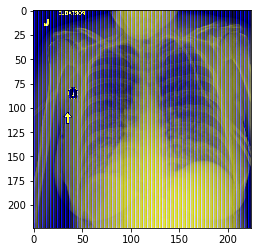

Progress 24600/26681
Saving f6cfde90-10de-4584-aed1-2a0ef8238b11 as ../rsna-pneumonia-retina/data/with_meta//f6cfde90-10de-4584-aed1-2a0ef8238b11.png


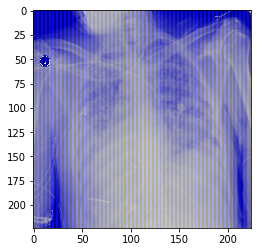

Progress 24700/26681
Saving f7b45870-76fe-42f3-9833-acef8c336dac as ../rsna-pneumonia-retina/data/with_meta//f7b45870-76fe-42f3-9833-acef8c336dac.png


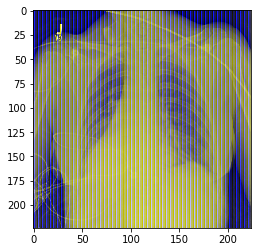

Progress 24800/26681
Saving f8a5a275-712b-433d-9578-84d44a87d062 as ../rsna-pneumonia-retina/data/with_meta//f8a5a275-712b-433d-9578-84d44a87d062.png


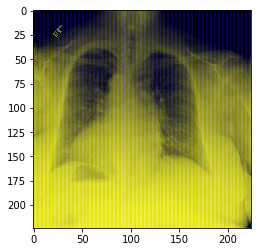

Progress 24900/26681
Saving f986edcb-2bc8-4bd0-9b22-e16f9633392d as ../rsna-pneumonia-retina/data/with_meta//f986edcb-2bc8-4bd0-9b22-e16f9633392d.png


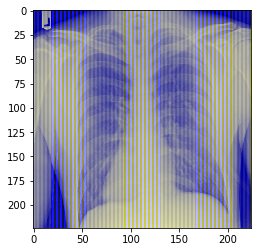

Progress 25000/26681
Saving fa4f2172-b7b7-47c9-ba52-04642e880a68 as ../rsna-pneumonia-retina/data/with_meta//fa4f2172-b7b7-47c9-ba52-04642e880a68.png


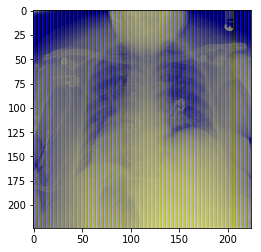

Progress 25100/26681
Saving fb28dcb2-055a-4619-9b8d-5ca654fd0345 as ../rsna-pneumonia-retina/data/with_meta//fb28dcb2-055a-4619-9b8d-5ca654fd0345.png


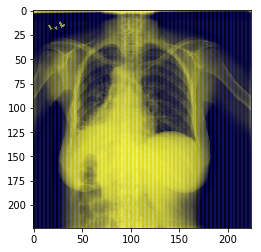

Progress 25200/26681
Saving fbf2ba14-0481-4fbb-82b1-f832b3949c82 as ../rsna-pneumonia-retina/data/with_meta//fbf2ba14-0481-4fbb-82b1-f832b3949c82.png


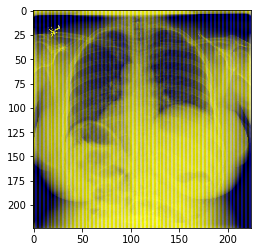

Progress 25300/26681
Saving fcce9705-b960-40f7-9426-4cd36b6f56e6 as ../rsna-pneumonia-retina/data/with_meta//fcce9705-b960-40f7-9426-4cd36b6f56e6.png


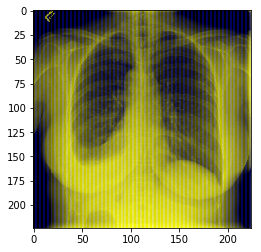

Progress 25400/26681
Saving fdbb8350-5309-4124-9206-a7db3e795a1f as ../rsna-pneumonia-retina/data/with_meta//fdbb8350-5309-4124-9206-a7db3e795a1f.png


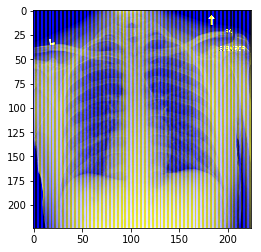

Progress 25500/26681
Saving fe973a22-141f-43cb-91d0-78da23fbd5d3 as ../rsna-pneumonia-retina/data/with_meta//fe973a22-141f-43cb-91d0-78da23fbd5d3.png


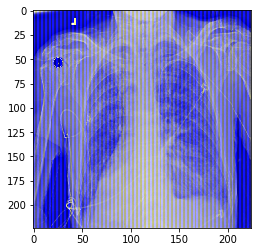

Progress 25600/26681
Saving ff5efd4a-0777-41b9-82c7-b73b4073c509 as ../rsna-pneumonia-retina/data/with_meta//ff5efd4a-0777-41b9-82c7-b73b4073c509.png


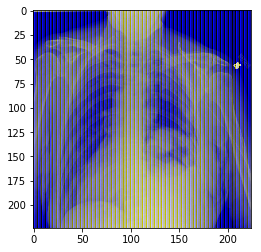

Progress 25700/26681
Saving 0088be53-27f2-4c30-882b-a73a3a5c8c71 as ../rsna-pneumonia-retina/data/with_meta//0088be53-27f2-4c30-882b-a73a3a5c8c71.png


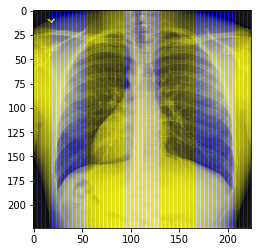

Progress 25800/26681
Saving 04e6f392-a196-447f-9b75-f5af995a36d0 as ../rsna-pneumonia-retina/data/with_meta//04e6f392-a196-447f-9b75-f5af995a36d0.png


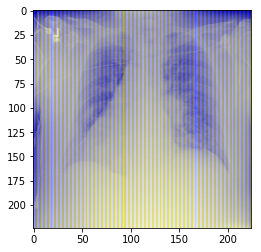

Progress 25900/26681
Saving 0fc18a4c-0666-4287-a25d-e295bcb18351 as ../rsna-pneumonia-retina/data/with_meta//0fc18a4c-0666-4287-a25d-e295bcb18351.png


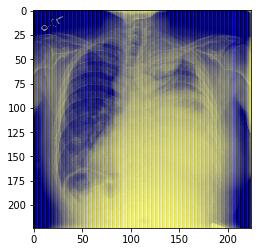

Progress 26000/26681
Saving 13ebcd6e-6a66-40c4-9d58-a5c177f8b037 as ../rsna-pneumonia-retina/data/with_meta//13ebcd6e-6a66-40c4-9d58-a5c177f8b037.png


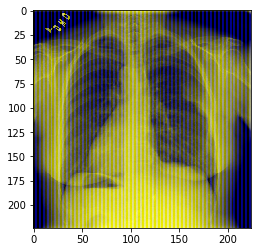

Progress 26100/26681
Saving 1bdb5d23-e594-4556-a8dc-0017e6bc5bf9 as ../rsna-pneumonia-retina/data/with_meta//1bdb5d23-e594-4556-a8dc-0017e6bc5bf9.png


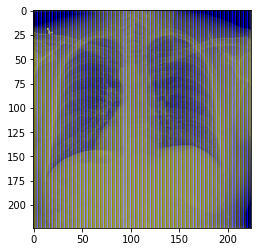

Progress 26200/26681
Saving 1feec494-6f00-4ddd-ac00-c4a5b5792e8b as ../rsna-pneumonia-retina/data/with_meta//1feec494-6f00-4ddd-ac00-c4a5b5792e8b.png


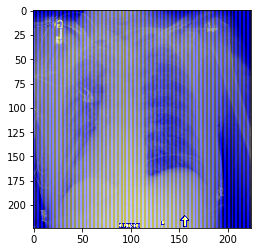

Progress 26300/26681
Saving 24d33a1b-f931-4635-8014-ffaf1d266986 as ../rsna-pneumonia-retina/data/with_meta//24d33a1b-f931-4635-8014-ffaf1d266986.png


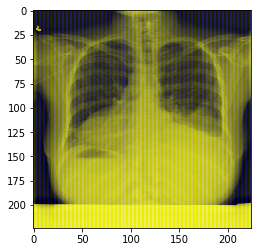

Progress 26400/26681
Saving 28ba0617-0cac-4198-8b8a-c35fde545ace as ../rsna-pneumonia-retina/data/with_meta//28ba0617-0cac-4198-8b8a-c35fde545ace.png


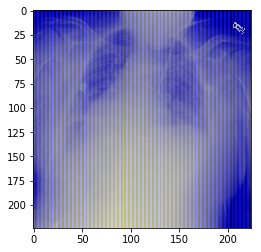

Progress 26500/26681
Saving 2cce4f3d-ad2a-4021-b46a-3f34015600e5 as ../rsna-pneumonia-retina/data/with_meta//2cce4f3d-ad2a-4021-b46a-3f34015600e5.png


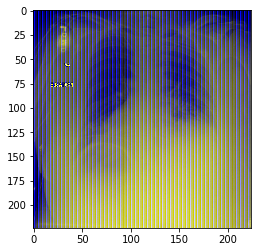

Progress 26600/26681
Saving 304e4772-d780-4620-9450-27c7a5b0ad29 as ../rsna-pneumonia-retina/data/with_meta//304e4772-d780-4620-9450-27c7a5b0ad29.png


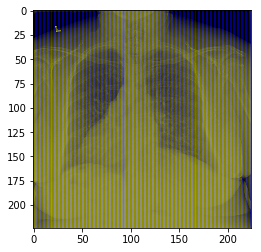

Progress 26681/26681
Saving c1f7889a-9ea9-4acb-b64c-b737c929599a as ../rsna-pneumonia-retina/data/with_meta//c1f7889a-9ea9-4acb-b64c-b737c929599a.png


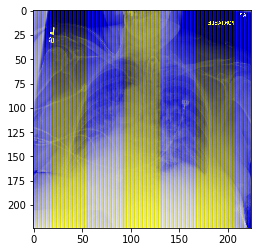

In [21]:
import cv2 

i = 0
sz = df_meta.patientId.unique().shape[0]
for patient_id in df_meta.patientId.unique(): 
    image = Image.open(f'../rsna-pneumonia-retina/data/processed/train_png/{patient_id}.png')    
    path = f'{output_dir}/{patient_id}.png'
    i+=1
    if (i % 100) == 0 or (i == sz):
        print(f'Progress {i}/{sz}')
        print(f'Saving {patient_id} as {path}')
        fake_img = get_img_meta(patient_id, image, df_meta)
        cv2.imwrite(path, fake_img)
        im2 = cv2.imread(path)
        plt.imshow(im2)
        plt.show()
        
        